In [1]:
import wandb
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import pandas as pd
import numpy as np
import scipy.stats as stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from itertools import combinations

In [2]:
import os

# Check if the CSV file exists
csv_file = "combined_run_data.csv"
if os.path.exists(csv_file):
    # If the CSV file exists, read it into the DataFrame
    df = pd.read_csv(csv_file)
    print("Data loaded from CSV file.")
else:
    # Initialize wandb API
    api = wandb.Api()

    # Define your projects
    projects = {
        "breakout": "sayf/atari-set-3",
        "alien": "sayf/atari-set-4",
        "donkey_kong": "sayf/atari-set-5",
        "galaxian": "sayf/atari-set-6",
        "asteroids": "sayf/atari-set-7",
        "space_invaders": "sayf/atari-set-8",
        "pong": "sayf/atari-set-9"
    }

    # Prepare a list to hold all run information across projects
    all_run_data = []

    # Iterate through each project and collect run data
    for game, project in projects.items():
        print(f"Fetching runs for project: {project} ({game})")
        runs = api.runs(project)
        
        for run in runs:
            tags = run.tags  # Get tags for the run
            config = run.config  # Get config for the run
            history = run.history(keys=["charts/episodic_return"], pandas=True)  # Get episodic return data as a pandas DataFrame

            run_info = {
                "run_id": run.id,
                "project": game,  # Add the game/project name
                "tags": tags if tags else ["untagged"],
                "config": config  # Add the config to the run_info
            }

            if "charts/episodic_return" in history.columns:
                total_steps = len(history)
                if total_steps == 0:
                    run_info["avg_episodic_return_last_10"] = None
                    run_info["var_episodic_return_last_10"] = None
                else:
                    # Calculate the index that marks the beginning of the last 10%
                    last_10_percent_index = max(int(total_steps * 0.9), 0)
                    # Slice the DataFrame to get the last 10% of the episodic return data
                    last_10_percent_history = history["charts/episodic_return"].iloc[last_10_percent_index:]
                    # Calculate the average episodic return for the last 10%
                    avg_episodic_return_last_10 = last_10_percent_history.mean()
                    run_info["avg_episodic_return_last_10"] = avg_episodic_return_last_10

                    var_episodic_return_last_10 = last_10_percent_history.var()
                    run_info["var_episodic_return_last_10"] = var_episodic_return_last_10
            else:
                run_info["avg_episodic_return_last_10"] = None
                run_info["var_episodic_return_last_10"] = None

            all_run_data.append(run_info)

    # Create a DataFrame from the collected run data
    df = pd.DataFrame(all_run_data)

    # Display the first few rows of the DataFrame
    print("Combined DataFrame from all projects:")
    print(df.head())

    # Optionally, save the DataFrame to a CSV file for future use
    df.to_csv(csv_file, index=False)

Fetching runs for project: sayf/atari-set-3 (breakout)
Fetching runs for project: sayf/atari-set-4 (alien)
Fetching runs for project: sayf/atari-set-5 (donkey_kong)
Fetching runs for project: sayf/atari-set-6 (galaxian)
Fetching runs for project: sayf/atari-set-7 (asteroids)
Fetching runs for project: sayf/atari-set-8 (space_invaders)
Fetching runs for project: sayf/atari-set-9 (pong)
Combined DataFrame from all projects:
     run_id   project                                               tags  \
0  0ejtw9cx  breakout  [grayscale_jpeg_quality_50_resolution_64x64_fr...   
1  jjcaib2f  breakout  [grayscale_jpeg_quality_50_resolution_64x64_fr...   
2  lq3po0t1  breakout  [grayscale_jpeg_quality_50_resolution_64x64_fr...   
3  pd8gdq14  breakout  [grayscale_jpeg_quality_50_resolution_64x64_fr...   
4  imdqo09q  breakout  [grayscale_jpeg_quality_50_resolution_64x64_fr...   

                                              config  \
0  {'tau': 1, 'seed': 1, 'end_e': 0.01, 'gamma': ...   
1  {'

Grouped and Averaged Episodic Return (Last 10%) by Project and Tag
      project                                               tags  \
179  galaxian                      resolution_84x84_frame_skip_4   
178  galaxian                      resolution_84x84_frame_skip_2   
175  galaxian                      resolution_74x74_frame_skip_2   
176  galaxian                      resolution_74x74_frame_skip_4   
172  galaxian                      resolution_64x64_frame_skip_2   
..        ...                                                ...   
182      pong  grayscale_jpeg_quality_50_resolution_64x64_fra...   
207      pong                      resolution_64x64_frame_skip_0   
192      pong            grayscale_resolution_74x74_frame_skip_0   
191      pong            grayscale_resolution_64x64_frame_skip_4   
198      pong      jpeg_quality_50_resolution_64x64_frame_skip_0   

     avg_episodic_return_last_10  run_count  
179                  6061.866667          3  
178                  599

/tmp/ipykernel_2059/4015805009.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=project_df, x="avg_episodic_return_last_10", y="tags", ax=ax, palette="viridis")
/tmp/ipykernel_2059/4015805009.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=project_df, x="avg_episodic_return_last_10", y="tags", ax=ax, palette="viridis")
/tmp/ipykernel_2059/4015805009.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=project_df, x="avg_episodic_return_last_10", y="tags", ax=ax, palette="viridis")
/tmp/ipykernel_2059/4015805009.py:33:

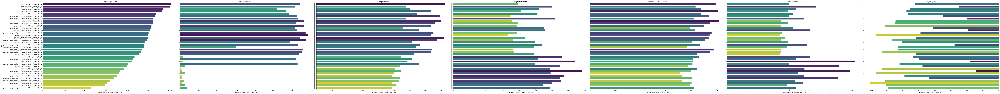

In [3]:
if "avg_episodic_return_last_10" in df.columns:
    df = df.sort_values(by="avg_episodic_return_last_10", ascending=False)

    # Check if 'tags' column exists and is not empty
    if "tags" in df.columns and not df["tags"].empty:
        # Explode the tags list to allow grouping by each tag individually
        df_exploded = df.explode("tags")

        # Group by tags and calculate the average episodic return and count of runs for each tag
        grouped_df = (
            df_exploded.groupby(["project", "tags"])
            .agg(
                avg_episodic_return_last_10=("avg_episodic_return_last_10", "mean"),
                run_count=("run_id", "count")
            )
            .reset_index()
        )

        # Sort the DataFrame by average episodic return in descending order
        grouped_df = grouped_df.sort_values(by="avg_episodic_return_last_10", ascending=False)

        # Display the results
        print("Grouped and Averaged Episodic Return (Last 10%) by Project and Tag")
        print(grouped_df)

        # Plot the results in subplots according to project
        projects = grouped_df["project"].unique()
        num_projects = len(projects)
        fig, axes = plt.subplots(nrows=1, ncols=num_projects, figsize=(15 * num_projects, 10), sharey=True)

        for ax, project in zip(axes, projects):
            project_df = grouped_df[grouped_df["project"] == project]
            sns.barplot(data=project_df, x="avg_episodic_return_last_10", y="tags", ax=ax, palette="viridis")
            ax.set_title(f"Project: {project}")
            ax.set_xlabel("Average Episodic Return (Last 10%)")
            ax.set_ylabel("Tags")

        plt.tight_layout()
        plt.show()
    else:
        print("No tags found in the runs. Unable to group by tags.")
        # Display the ungrouped results
        print("Averaged Episodic Return (Last 10%) by Run")
        print(df[["run_id", "avg_episodic_return_last_10"]])

        # Plot the results
        plt.figure(figsize=(12, 8))  # Increase figure size for better readability
        plt.barh(df["run_id"], df["avg_episodic_return_last_10"], color="skyblue")  # Use horizontal bar plot
        plt.xlabel("Average Episodic Return (Last 10%)")
        plt.ylabel("Run ID")
        plt.title("Average Episodic Return (Last 10%) by Run")
        plt.tight_layout()
        plt.show()
else:
    print("No 'avg_episodic_return_last_10' data found in any of the runs.")
    # Optionally, handle cases where the new metric isn't available

/tmp/ipykernel_2059/524753591.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




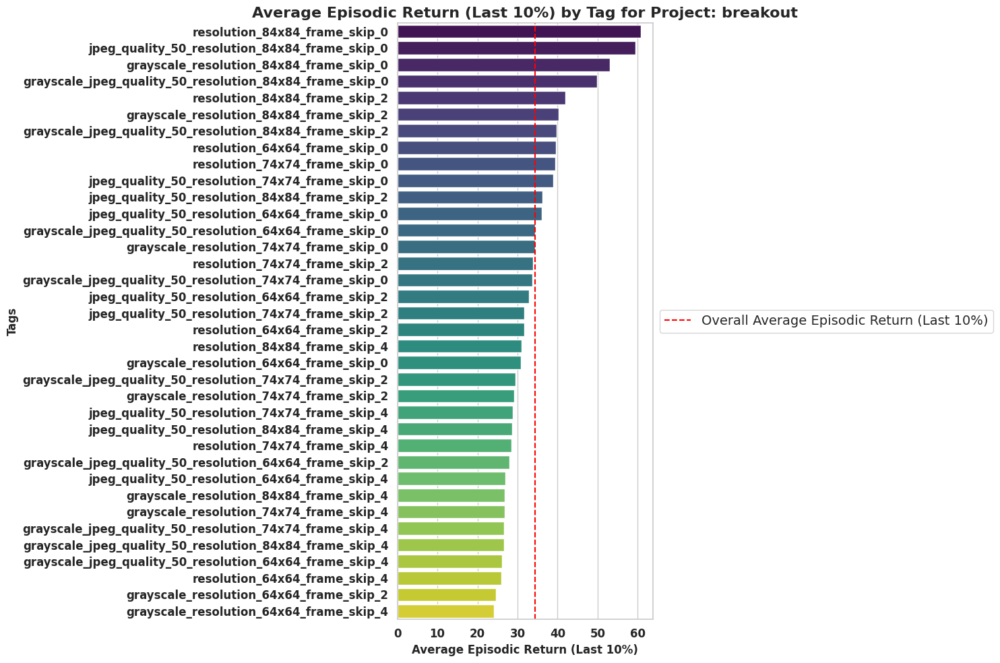

/tmp/ipykernel_2059/524753591.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




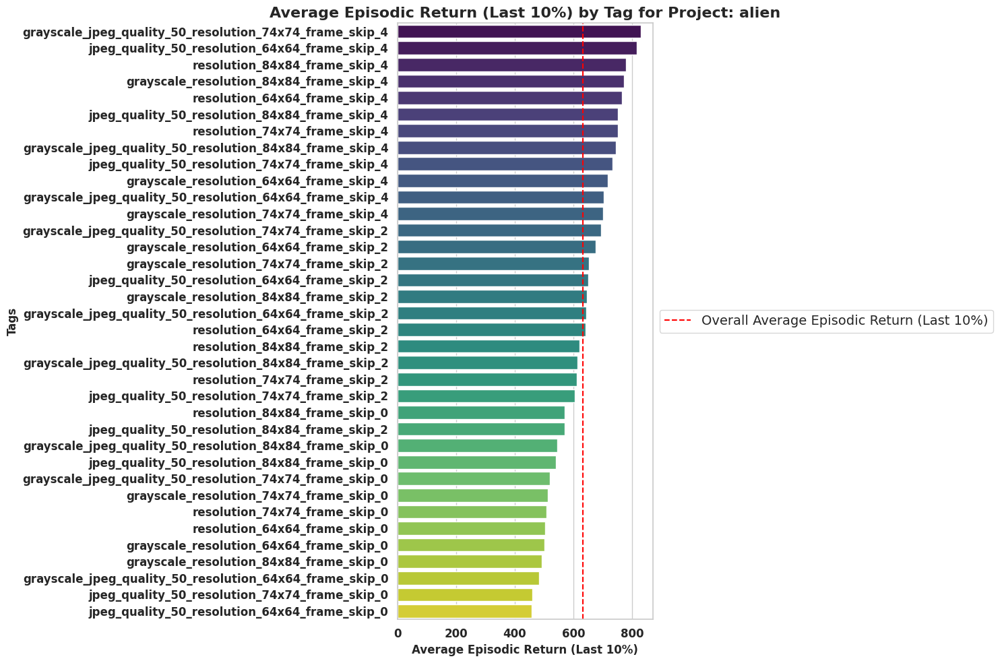

/tmp/ipykernel_2059/524753591.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




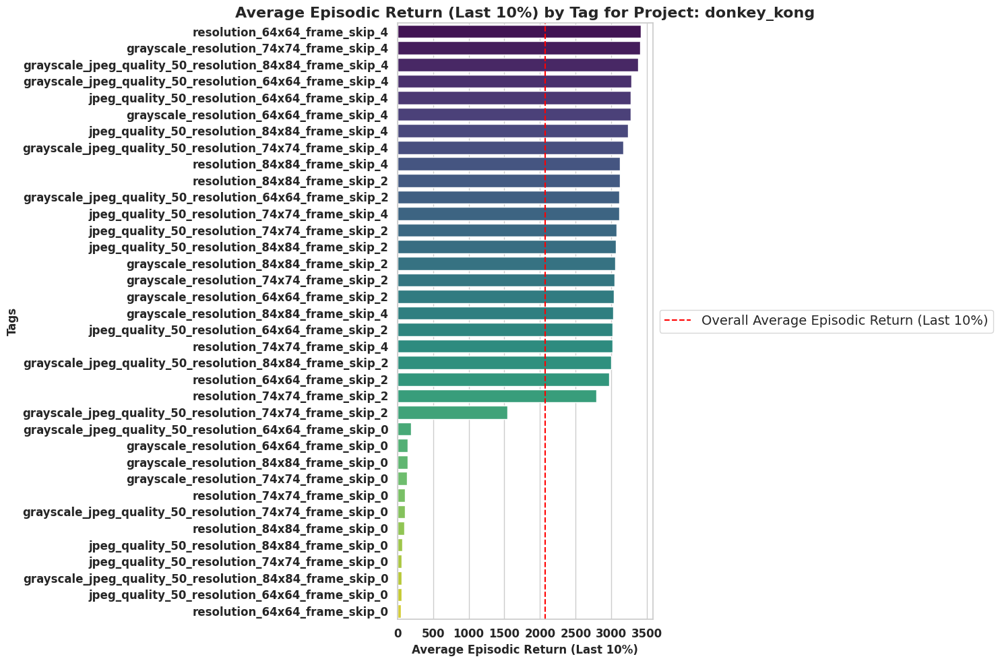

/tmp/ipykernel_2059/524753591.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




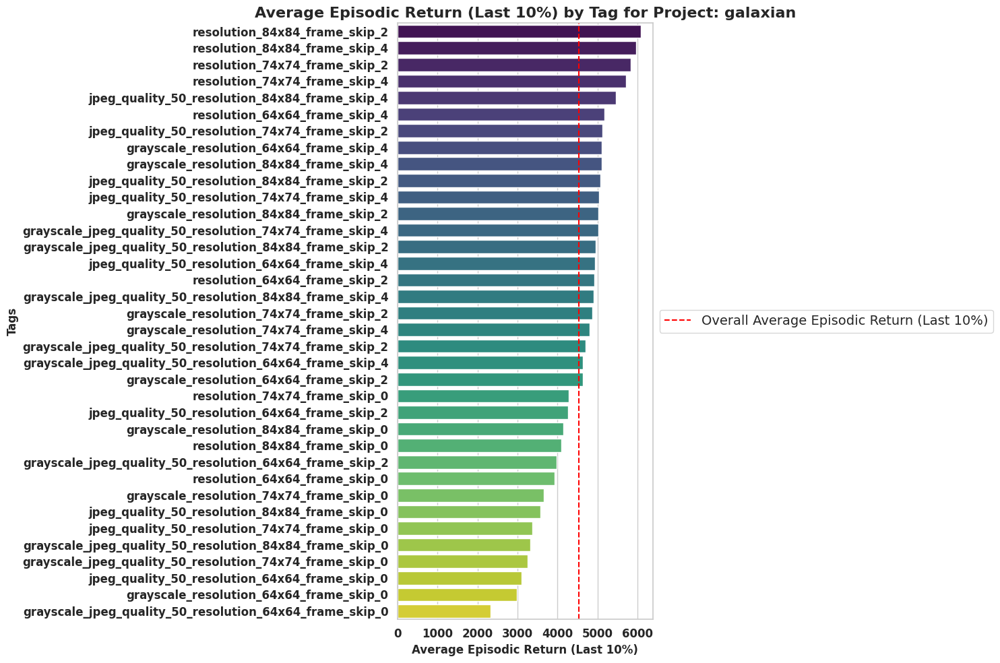

/tmp/ipykernel_2059/524753591.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




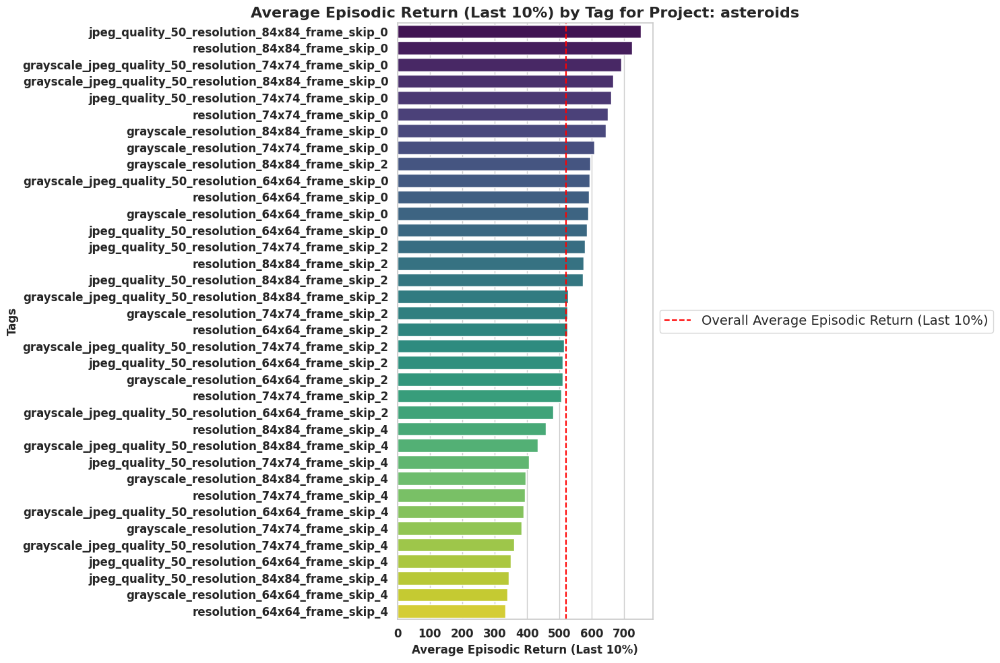

/tmp/ipykernel_2059/524753591.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




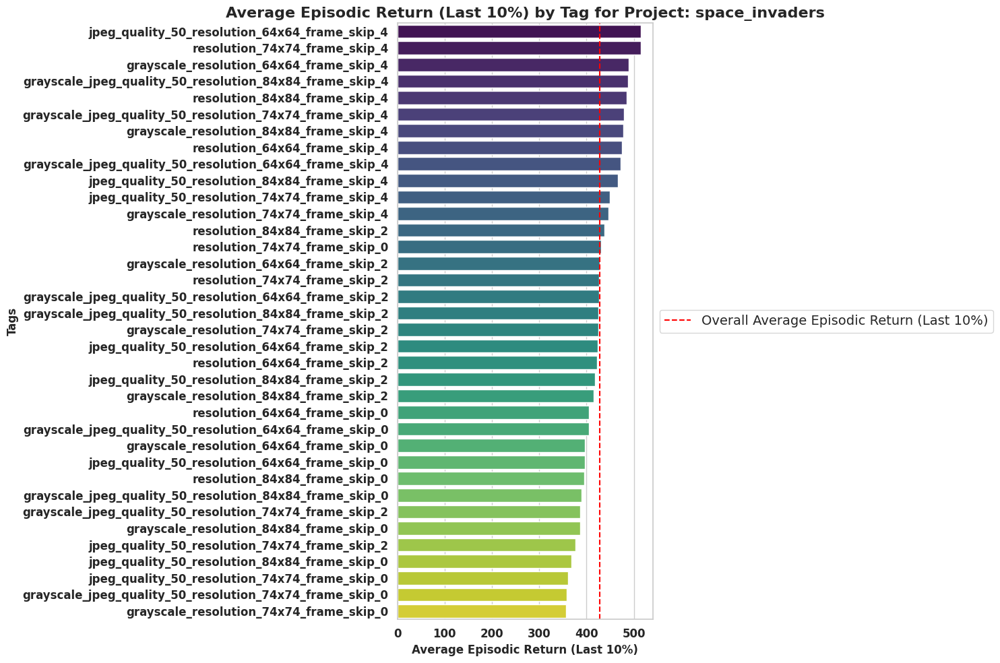

/tmp/ipykernel_2059/524753591.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




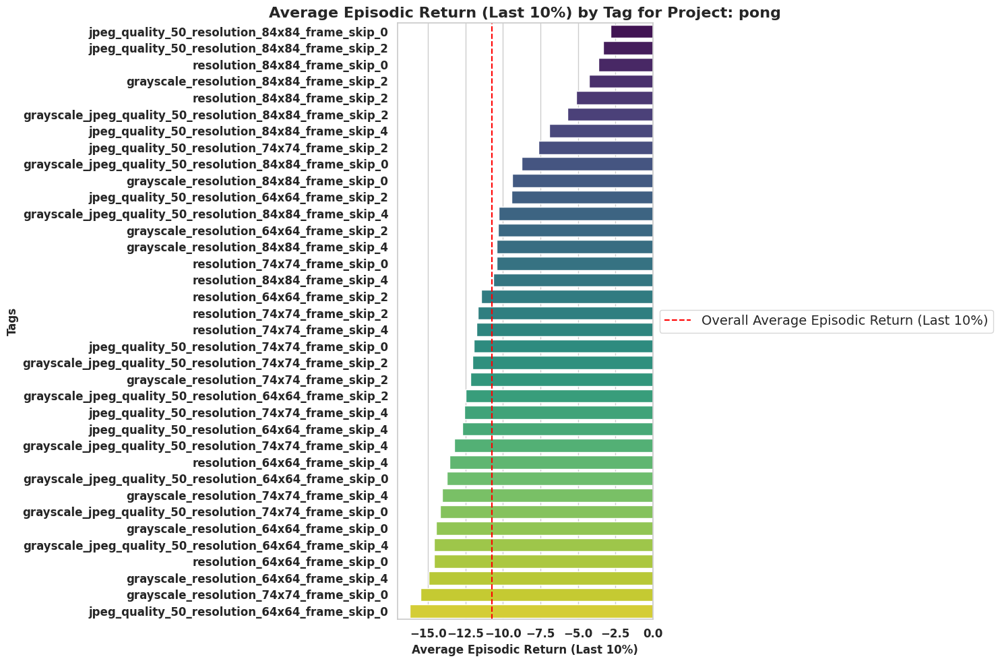

In [106]:
if "avg_episodic_return_last_10" in df.columns:
    # Explode the tags list to allow grouping by each tag individually
    df_exploded = df.explode("tags")

    # Get unique projects
    projects = df_exploded["project"].unique()

    for project in projects:
        project_df = df_exploded[df_exploded["project"] == project]
        
        # Calculate the mean episodic return per tag and sort descending
        tag_means = project_df.groupby("tags")["avg_episodic_return_last_10"].mean().sort_values(ascending=False)
        
        plt.figure(figsize=(15, 10))  # Adjust figure size for better readability

        # Create a horizontal bar plot with tags sorted by highest average return
        sns.barplot(x=tag_means.values, y=tag_means.index, palette="viridis")
        
        # Add a vertical line for the overall average episodic return
        plt.axvline(x=tag_means.mean(), color="red", linestyle="--", label="Overall Average Episodic Return (Last 10%)")
        
        plt.xlabel("Average Episodic Return (Last 10%)", fontsize=12, fontweight='bold')
        plt.ylabel("Tags", fontsize=12, fontweight='bold')
        plt.title(f"Average Episodic Return (Last 10%) by Tag for Project: {project}", fontsize=16, fontweight='bold')
        
        # Place the legend outside the plot
        plt.legend(fontsize=14, title_fontsize=14, loc='center left', bbox_to_anchor=(1, 0.5))
        
        plt.xticks(fontsize=12, fontweight='bold')
        plt.yticks(fontsize=12, fontweight='bold')
        plt.tight_layout()
        
        # Save the plot as an SVG file
        safe_project_name = "".join([c if c.isalnum() or c in (' ', '_') else '_' for c in project]).replace(' ', '_')
        plt.savefig(f"avg_episodic_return_last_10_{safe_project_name}.svg", format='svg', bbox_inches='tight')
        
        plt.show()
else:
    print("No 'avg_episodic_return_last_10' data found in any of the runs.")

Correlation with Average Episodic Return (Last 10%):
avg_episodic_return_last_10    1.000000
resolution_width               0.623502
resolution_height              0.623502
jpeg_quality                  -0.039055
frame_skip                    -0.078323
grayscale                     -0.219393
Name: avg_episodic_return_last_10, dtype: float64


/tmp/ipykernel_2059/4112962274.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df["grayscale"] = filtered_df["grayscale"].astype(int, errors='ignore')  # Convert boolean to int


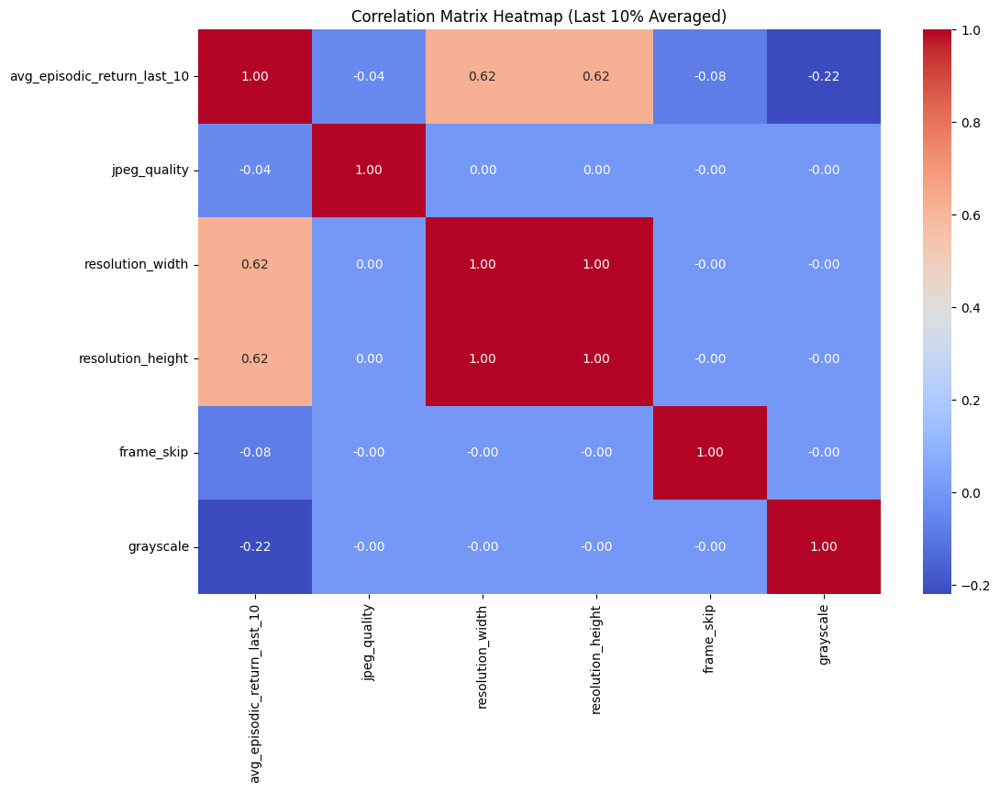

In [5]:
param_data = []

for run in runs:
    params = run.config  # Get parameters for the run
    if params:
        params["run_id"] = run.id
        param_data.append(params)

# Convert parameters to DataFrame
param_df = pd.DataFrame(param_data)

# Merge parameters with performance metrics
merged_df = pd.merge(df, param_df, on="run_id")

# Select only the relevant columns, including the new metric
selected_columns = ["avg_episodic_return_last_10", "jpeg_quality", "resolution_width", "resolution_height", "frame_skip", "grayscale"]
filtered_df = merged_df[selected_columns]

# Ensure 'grayscale' is present and convert it to int
if 'grayscale' in filtered_df.columns:
    filtered_df["grayscale"] = filtered_df["grayscale"].astype(int, errors='ignore')  # Convert boolean to int

# Convert non-numeric columns to numeric where possible, and drop the rest
numeric_df = filtered_df.apply(pd.to_numeric, errors='coerce')

# Drop columns with all NaN values (non-convertible columns)
numeric_df = numeric_df.dropna(axis=1, how='all')

# Compute correlation matrix
correlation_matrix = numeric_df.corr()

# Display correlation with avg_episodic_return_last_10
print("Correlation with Average Episodic Return (Last 10%):")
print(correlation_matrix["avg_episodic_return_last_10"].sort_values(ascending=False))

# Plot heatmap of the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Matrix Heatmap (Last 10% Averaged)")
plt.show()

# import json

# # Function to safely parse the config string into a dictionary
# def parse_config(config_str):
#     try:
#         # Attempt to parse the string as JSON
#         return json.loads(config_str)
#     except (TypeError, json.JSONDecodeError):
#         # Return an empty dictionary if parsing fails
#         return {}

# # Extract configuration parameters from the 'config' column
# def extract_config_params(config):
#     return {
#         "jpeg_quality": config.get("jpeg_quality"),
#         "resolution_width": config.get("resolution_width"),
#         "resolution_height": config.get("resolution_height"),
#         "frame_skip": config.get("frame_skip"),
#         "grayscale": int(config.get("grayscale", False))  # Convert boolean to int
#     }

# # Parse the config column
# df['parsed_config'] = df['config'].apply(parse_config)

# # Apply the extraction function to each row
# config_params_df = df['parsed_config'].apply(extract_config_params).apply(pd.Series)

# # Concatenate the extracted configuration parameters with the original DataFrame
# # Use `join` with suffixes to avoid column overlap
# df = df.join(config_params_df, rsuffix='_config')

# # Select only the relevant columns, including the new metric
# selected_columns = ["project", "avg_episodic_return_last_10", "jpeg_quality_config", "resolution_width_config", "resolution_height_config", "frame_skip_config", "grayscale_config"]
# filtered_df = df[selected_columns]

# # Ensure 'project' column is not converted to numeric
# numeric_columns = filtered_df.columns.difference(['project'])

# # Convert non-numeric columns to numeric where possible, and drop the rest
# numeric_df = filtered_df[numeric_columns].apply(pd.to_numeric, errors='coerce')

# # Add the 'project' column back to numeric_df
# numeric_df['project'] = filtered_df['project']

# # Compute correlation matrix for each project
# for project in numeric_df['project'].unique():
#     project_df = numeric_df[numeric_df['project'] == project]
    
#     # Select only numeric columns for correlation
#     numeric_project_df = project_df.select_dtypes(include=[np.number])
    
#     correlation_matrix = numeric_project_df.corr()

#     # Display correlation with avg_episodic_return_last_10
#     print(f"Correlation with Average Episodic Return (Last 10%) for project {project}:")
#     print(correlation_matrix["avg_episodic_return_last_10"].sort_values(ascending=False))

#     # Plot heatmap of the correlation matrix
#     plt.figure(figsize=(12, 8))
#     sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
#     plt.title(f"Correlation Matrix Heatmap (Last 10% Averaged) for project {project}")
#     plt.show()

In [6]:
# Assuming 'filtered_df' is your DataFrame with the relevant columns
# Ensure 'filtered_df' is defined as in your previous code

# Create a parallel coordinates plot using Plotly
fig = px.parallel_coordinates(
    filtered_df,
    color='avg_episodic_return_last_10',
    labels={
        "resolution_width": "Resolution Width",
        "resolution_height": "Resolution Height",
        "jpeg_quality": "JPEG Quality",
        "grayscale": "Grayscale",
        "frame_skip": "Frame Skip",
        "avg_episodic_return_last_10": "Avg Episodic Return (Last 10%)"
    },
    dimensions=[
        "resolution_width",
        "resolution_height",
        "jpeg_quality",
        "grayscale",
        "frame_skip",
        "avg_episodic_return_last_10"
    ],
    color_continuous_scale=px.colors.diverging.Tealrose,
    color_continuous_midpoint=filtered_df['avg_episodic_return_last_10'].mean()
)

fig.update_layout(
    title="",
    plot_bgcolor='black',
    paper_bgcolor='black',
    font_color='white'
)

In [7]:
# Sort the DataFrame by 'avg_episodic_return_last_10' in descending order
top_runs = filtered_df.sort_values(by='avg_episodic_return_last_10', ascending=False).head(5)

# Define the parameters that constitute a "route"
route_columns = ["resolution_width", "resolution_height", "jpeg_quality", "grayscale", "frame_skip"]

# Count the occurrences of each unique route
route_counts = top_runs[route_columns].value_counts()

# Get the most common route
most_common_route = route_counts.idxmax()

# Output the most common route formatted as a string
most_common_route_str = " -> ".join([f"{col}: {val}" for col, val in zip(route_columns, most_common_route)])
print("Most Common Route among Top 5 Runs:")
print(most_common_route_str)


Most Common Route among Top 5 Runs:
resolution_width: 84 -> resolution_height: 84 -> jpeg_quality: 100 -> grayscale: 1 -> frame_skip: 2


Human-Normalized Scores (HNS) Statistics:
count    539.000000
mean       0.333062
std        0.444835
min       -0.008852
25%        0.045160
50%        0.171105
75%        0.337557
max        2.147917
Name: HNS, dtype: float64


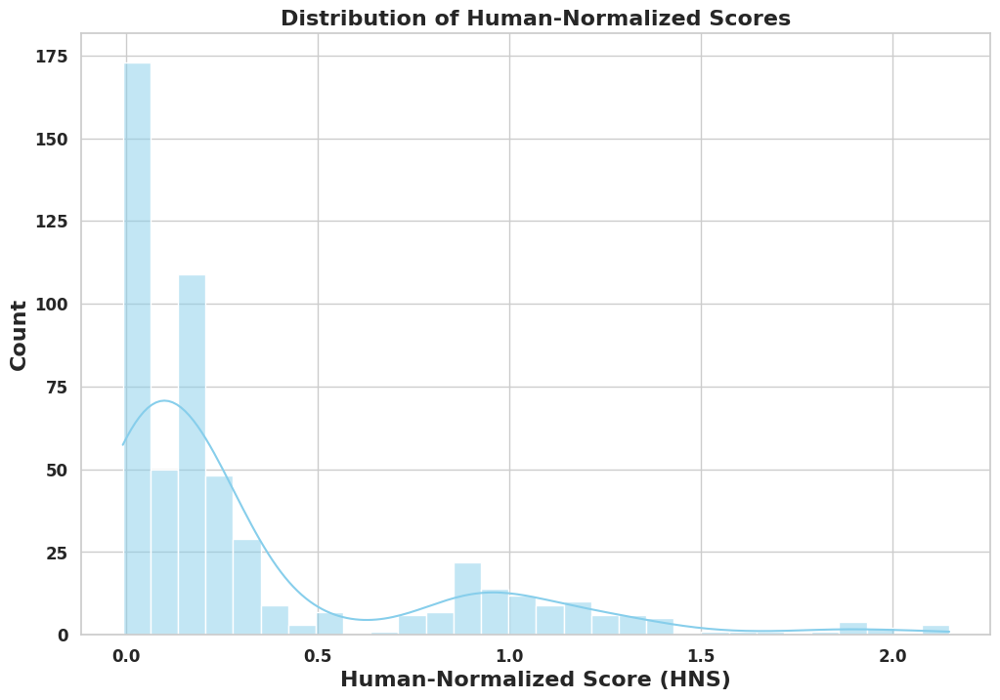

In [35]:
# 1. Human-Normalized Scores (HNS)

# Placeholder for human and random scores per game
# Replace these dictionaries with actual scores from benchmarks
human_scores = {
    'alien': 7127.7,
    'breakout': 30.5,
    'asteroids': 47388.7,
    'space_invaders': 1668.7,
    'pong': 14.6
}

random_scores = {
    'alien': 227.8,
    'breakout': 1.7,
    'asteroids': 719.1,
    'space_invaders': 148.0,
    'pong': -20.7
}


def compute_hns(row):
    game = row['project']
    agent_score = row['avg_episodic_return_last_10']
    human_score = human_scores.get(game)
    random_score = random_scores.get(game)
    
    if human_score is None or random_score is None:
        return None  # Cannot compute HNS without both scores
    
    if (human_score - random_score) == 0:
        return None  # Avoid division by zero
    
    hns = (agent_score - random_score) / (human_score - random_score)
    return hns

# Apply the HNS computation
df['HNS'] = df.apply(compute_hns, axis=1)

# Drop rows where HNS could not be computed
df_hns = df.dropna(subset=['HNS'])

# Display HNS statistics
print("Human-Normalized Scores (HNS) Statistics:")
print(df_hns['HNS'].describe())

# Plot HNS and save as a vector plot
plt.figure(figsize=(12, 8))
sns.histplot(df_hns['HNS'], bins=30, kde=True, color='skyblue')
plt.xlabel('Human-Normalized Score (HNS)', fontsize=16, fontweight='bold')
plt.title('Distribution of Human-Normalized Scores', fontsize=16, fontweight='bold')
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.ylabel('Count', fontsize=16, fontweight='bold')  # Make y-axis label bold
plt.savefig('hns_distribution.svg', format='svg')  # Save as SVG for vector format
plt.show()

In [9]:
def parse_tags(tag_list):
    """
    Parse a list of tag strings and extract configuration parameters.

    Parameters:
    - tag_list (list of str): List of tag strings for a run.

    Returns:
    - dict: Extracted configuration parameters.
    """
    # Initialize default configuration
    config = {
        'grayscale': False,
        'jpeg_quality': None,
        'resolution_width': None,
        'resolution_height': None,
        'frame_skip': None
    }

    if not tag_list:
        return config

    # Assuming one tag per run based on provided data
    tag_str = tag_list[0]  # Modify if multiple tags per run

    # Split the tag string by '_'
    parts = tag_str.split('_')

    i = 0
    while i < len(parts):
        part = parts[i]
        if part == 'grayscale':
            config['grayscale'] = True
            i += 1
        elif part == 'jpeg':
            # Expect 'jpeg_quality_<value>'
            if i + 2 < len(parts) and parts[i+1] == 'quality':
                try:
                    config['jpeg_quality'] = int(parts[i+2])
                except ValueError:
                    config['jpeg_quality'] = None
                i += 3
            else:
                i += 1
        elif part == 'resolution':
            # Expect 'resolution_<width>x<height>'
            if i + 1 < len(parts):
                res_parts = parts[i+1].split('x')
                if len(res_parts) == 2:
                    try:
                        config['resolution_width'] = int(res_parts[0])
                        config['resolution_height'] = int(res_parts[1])
                    except ValueError:
                        config['resolution_width'] = None
                        config['resolution_height'] = None
                i += 2
            else:
                i += 1
        elif part == 'frame':
            # Expect 'frame_skip_<value>'
            if i + 2 < len(parts) and parts[i+1] == 'skip':
                try:
                    config['frame_skip'] = int(parts[i+2])
                except ValueError:
                    config['frame_skip'] = None
                i += 3
            else:
                i += 1
        else:
            i += 1

    return config

# Apply the parse_tags function to each row's tags
parsed_configs = df['tags'].apply(parse_tags).apply(pd.Series)

# Concatenate the parsed configuration columns to the original DataFrame
df = pd.concat([df, parsed_configs], axis=1)

# Fill missing values if necessary
df['grayscale'] = df['grayscale'].fillna(False)


# Define the 'configuration' column based on extracted parameters
df['configuration'] = df.apply(
    lambda row: f"Res:{row['resolution_width']}x{row['resolution_height']}_"
                f"JPEG:{row['jpeg_quality']}_"
                f"Gray:{int(row['grayscale'])}_"
                f"FrameSkip:{row['frame_skip']}",
    axis=1
)

# Preview the updated DataFrame
print(df[['run_id', 'tags', 'configuration']].head())



# Check for missing values in configuration columns
print("Missing values in configuration parameters:")
print(df[['grayscale', 'jpeg_quality', 'resolution_width', 'resolution_height', 'frame_skip']].isnull().sum())

# Optionally, handle missing values by assigning default values or excluding such runs from certain analyses
# For example, filling missing 'jpeg_quality' with a default value like 100
df['jpeg_quality'] = df['jpeg_quality'].fillna(100)

# Similarly, handle other missing parameters as per your experimental design
df['resolution_width'] = df['resolution_width'].fillna(df['resolution_width'].mode()[0])
df['resolution_height'] = df['resolution_height'].fillna(df['resolution_height'].mode()[0])
df['frame_skip'] = df['frame_skip'].fillna(df['frame_skip'].mode()[0])

# Re-create the 'configuration' column if values were filled
df['configuration'] = df.apply(
    lambda row: f"Res:{int(row['resolution_width'])}x{int(row['resolution_height'])}_"
                f"JPEG:{int(row['jpeg_quality'])}_"
                f"Gray:{int(row['grayscale'])}_"
                f"FrameSkip:{int(row['frame_skip'])}",
    axis=1
)

# Verify the filled values
print("\nUpdated Configuration Parameters:")
print(df[['configuration']].head())

       run_id                             tags  \
427  0u8lvudy  [resolution_84x84_frame_skip_2]   
430  493miz92  [resolution_84x84_frame_skip_4]   
431  gyo0cbu3  [resolution_84x84_frame_skip_4]   
429  cbttuop9  [resolution_84x84_frame_skip_4]   
419  xmsubx77  [resolution_74x74_frame_skip_2]   

                             configuration  
427  Res:84x84_JPEG:nan_Gray:0_FrameSkip:2  
430  Res:84x84_JPEG:nan_Gray:0_FrameSkip:4  
431  Res:84x84_JPEG:nan_Gray:0_FrameSkip:4  
429  Res:84x84_JPEG:nan_Gray:0_FrameSkip:4  
419  Res:74x74_JPEG:nan_Gray:0_FrameSkip:2  
Missing values in configuration parameters:
grayscale              0
jpeg_quality         379
resolution_width       0
resolution_height      0
frame_skip             0
dtype: int64

Updated Configuration Parameters:
                             configuration
427  Res:84x84_JPEG:100_Gray:0_FrameSkip:2
430  Res:84x84_JPEG:100_Gray:0_FrameSkip:4
431  Res:84x84_JPEG:100_Gray:0_FrameSkip:4
429  Res:84x84_JPEG:100_Gray:0_FrameSkip

In [10]:
# Perform descriptive statistics
descriptive_stats = df.groupby('configuration')['avg_episodic_return_last_10'].agg(['mean', 'std', 'count']).reset_index()
descriptive_stats = descriptive_stats.rename(columns={'mean': 'Mean Return', 'std': 'Std Dev Return', 'count': 'Run Count'})

print("\nDescriptive Statistics by Configuration:")
print(descriptive_stats)


Descriptive Statistics by Configuration:
                            configuration  Mean Return  Std Dev Return  \
0   Res:64x64_JPEG:100_Gray:0_FrameSkip:0   770.616190     1295.646748   
1   Res:64x64_JPEG:100_Gray:0_FrameSkip:2  1408.938095     1900.388383   
2   Res:64x64_JPEG:100_Gray:0_FrameSkip:4  1455.805714     1906.849787   
3   Res:64x64_JPEG:100_Gray:1_FrameSkip:0   647.639048      975.533015   
4   Res:64x64_JPEG:100_Gray:1_FrameSkip:2  1326.669524     1703.537127   
5   Res:64x64_JPEG:100_Gray:1_FrameSkip:4  1421.956190     1873.407210   
6    Res:64x64_JPEG:50_Gray:0_FrameSkip:0   659.550476     1032.699314   
7    Res:64x64_JPEG:50_Gray:0_FrameSkip:2  1304.860000     1637.883737   
8    Res:64x64_JPEG:50_Gray:0_FrameSkip:4  1364.620952     1749.318697   
9    Res:64x64_JPEG:50_Gray:1_FrameSkip:0   571.457143      757.460028   
10   Res:64x64_JPEG:50_Gray:1_FrameSkip:2  1249.287619     1552.284896   
11   Res:64x64_JPEG:50_Gray:1_FrameSkip:4  1354.226667     1737.833317

In [11]:
# Splitting the DataFrame by environment

# Assuming 'project' column indicates the environment
environments = df['project'].unique()

# Create a dictionary to hold DataFrames for each environment
env_dfs = {env: df[df['project'] == env].reset_index(drop=True) for env in environments}

print("Environments and the number of runs in each:")
for env, env_df in env_dfs.items():
    print(f"{env}: {len(env_df)} runs")

Environments and the number of runs in each:
galaxian: 108 runs
donkey_kong: 108 runs
alien: 107 runs
asteroids: 108 runs
space_invaders: 108 runs
breakout: 109 runs
pong: 108 runs


In [12]:
def compute_descriptive_stats(env_df):
    """
    Compute descriptive statistics for each configuration within an environment.

    Parameters:
    - env_df (DataFrame): DataFrame for a specific environment.

    Returns:
    - descriptive_stats (DataFrame): Mean, std, and count per configuration.
    """
    descriptive_stats = env_df.groupby('configuration')['avg_episodic_return_last_10'].agg(['mean', 'std', 'count']).reset_index()
    descriptive_stats = descriptive_stats.rename(columns={'mean': 'Mean Return', 'std': 'Std Dev Return', 'count': 'Run Count'})
    return descriptive_stats

def perform_t_tests(env_df):
    """
    Perform pairwise T-tests between configurations within an environment.

    Applies Bonferroni correction for multiple comparisons.

    Parameters:
    - env_df (DataFrame): DataFrame for a specific environment.

    Returns:
    - t_test_df (DataFrame): T-test results with Bonferroni correction.
    """
    configurations = env_df['configuration'].unique()
    t_test_results = []

    for config1, config2 in combinations(configurations, 2):
        data1 = env_df[env_df['configuration'] == config1]['avg_episodic_return_last_10']
        data2 = env_df[env_df['configuration'] == config2]['avg_episodic_return_last_10']

        t_stat, p_val = stats.ttest_ind(data1, data2, equal_var=False)  # Welch's T-test
        t_test_results.append({
            'Configuration 1': config1,
            'Configuration 2': config2,
            'T-Statistic': t_stat,
            'P-Value': p_val
        })

    t_test_df = pd.DataFrame(t_test_results)
    num_tests = len(t_test_df)
    t_test_df['Bonferroni Corrected P-Value'] = t_test_df['P-Value'] * num_tests
    t_test_df['Significant'] = t_test_df['Bonferroni Corrected P-Value'] < 0.05

    return t_test_df

def perform_paired_t_tests(env_df):
    """
    Perform paired T-tests between configurations if runs can be paired.

    Parameters:
    - env_df (DataFrame): DataFrame for a specific environment.

    Returns:
    - paired_t_test_df (DataFrame): Paired T-test results with Bonferroni correction.
    """
    # Check if 'run_id' can be paired across configurations
    # This assumes that the same 'run_id' exists across different configurations
    pivot_df = env_df.pivot(index='run_id', columns='configuration', values='avg_episodic_return_last_10').dropna()
    configurations = pivot_df.columns.unique()
    paired_t_test_results = []

    for config1, config2 in combinations(configurations, 2):
        data1 = pivot_df[config1]
        data2 = pivot_df[config2]

        t_stat, p_val = stats.ttest_rel(data1, data2)
        paired_t_test_results.append({
            'Configuration 1': config1,
            'Configuration 2': config2,
            'T-Statistic': t_stat,
            'P-Value': p_val
        })

    paired_t_test_df = pd.DataFrame(paired_t_test_results)
    num_tests = len(paired_t_test_df)
    paired_t_test_df['Bonferroni Corrected P-Value'] = paired_t_test_df['P-Value'] * num_tests
    paired_t_test_df['Significant'] = paired_t_test_df['Bonferroni Corrected P-Value'] < 0.05

    return paired_t_test_df

def perform_anova(env_df):
    """
    Perform One-Way ANOVA and Tukey's HSD post-hoc test within an environment.

    Parameters:
    - env_df (DataFrame): DataFrame for a specific environment.

    Returns:
    - anova_result (tuple): ANOVA F-statistic and p-value.
    - tukey_summary (summary text): Tukey's HSD test summary if ANOVA is significant.
    """
    anova_model = ols('avg_episodic_return_last_10 ~ C(configuration)', data=env_df).fit()
    anova_table = sm.stats.anova_lm(anova_model, typ=2)

    f_stat = anova_table['F'][0]
    p_val = anova_table['PR(>F)'][0]

    tukey_summary = None
    if p_val < 0.05:
        tukey = pairwise_tukeyhsd(endog=env_df['avg_episodic_return_last_10'],
                                  groups=env_df['configuration'],
                                  alpha=0.05)
        tukey_summary = tukey.summary()

    return (f_stat, p_val), tukey_summary

def compute_effect_sizes(env_df, t_test_df):
    """
    Compute Cohen's d for T-tests and Eta Squared for ANOVA.

    Parameters:
    - env_df (DataFrame): DataFrame for a specific environment.
    - t_test_df (DataFrame): T-test results DataFrame.

    Returns:
    - t_test_df (DataFrame): Updated T-test results with Cohen's d.
    - eta_sq (float): Eta Squared value from ANOVA.
    """
    # Cohen's d
    def cohens_d(x, y):
        nx = len(x)
        ny = len(y)
        dof = nx + ny - 2
        pooled_std = np.sqrt(((nx-1)*x.std(ddof=1) ** 2 + (ny-1)*y.std(ddof=1) ** 2) / dof)
        d = (x.mean() - y.mean()) / pooled_std
        return d

    t_test_df['Cohen\'s d'] = t_test_df.apply(lambda row: cohens_d(
        env_df[env_df['configuration'] == row['Configuration 1']]['avg_episodic_return_last_10'],
        env_df[env_df['configuration'] == row['Configuration 2']]['avg_episodic_return_last_10']
    ), axis=1)

    # Eta Squared
    model = ols('avg_episodic_return_last_10 ~ C(configuration)', data=env_df).fit()
    anova_table = sm.stats.anova_lm(model, typ=2)
    eta_sq = anova_table['sum_sq'][0] / anova_table['sum_sq'].sum()

    return t_test_df, eta_sq

def perform_stability_analysis(env_df):
    """
    Assess training stability by calculating the variance of episodic return across the last 10% of steps for each run.

    Parameters:
    - env_df (DataFrame): DataFrame for a specific environment.

    Returns:
    - stability_stats (DataFrame): Mean and std dev of variance per configuration.
    """
    # Use the computed variance from the DataFrame
    stability_stats = env_df.groupby('configuration')['var_episodic_return_last_10'].agg(['mean', 'std']).reset_index()
    stability_stats = stability_stats.rename(columns={'mean': 'Mean Variance', 'std': 'Std Dev Variance'})
    return stability_stats

In [13]:
# Dictionary to store analysis results per environment
analysis_results = {}

for env, env_df in env_dfs.items():
    print(f"\nAnalyzing Environment: {env}")

    # 1. Descriptive Statistics
    descriptive_stats = compute_descriptive_stats(env_df)

    # 2. T-Tests
    t_test_df = perform_t_tests(env_df)

    # 3. Paired T-Tests (if applicable)
    paired_t_test_df = perform_paired_t_tests(env_df)

    # 4. ANOVA
    anova_result, tukey_summary = perform_anova(env_df)

    # 5. Effect Sizes
    t_test_df, eta_sq = compute_effect_sizes(env_df, t_test_df)

    # 6. Stability Analysis
    stability_stats = perform_stability_analysis(env_df)

    # Store results
    analysis_results[env] = {
        'descriptive_stats': descriptive_stats,
        't_tests': t_test_df,
        'paired_t_tests': paired_t_test_df,
        'anova': {'F-Statistic': anova_result[0], 'p-value': anova_result[1], 'Eta_Squared': eta_sq, 'Tukey': tukey_summary},
        'stability_stats': stability_stats
    }

    # Display Results
    print("\nDescriptive Statistics:")
    print(descriptive_stats)

    print("\nT-Test Results with Cohen's d:")
    print(t_test_df)

    print("\nPaired T-Test Results:")
    print(paired_t_test_df)

    print("\nANOVA Results:")
    # Corrected the indexing below
    print(f"F-Statistic: {anova_result[0]}, p-value: {anova_result[1]}, Eta Squared: {eta_sq}")
    if tukey_summary is not None:
        print("\nTukey's HSD Post-Hoc Test:")
        print(tukey_summary)

    print("\nStability Statistics:")
    print(stability_stats)


Analyzing Environment: galaxian


/tmp/ipykernel_2059/1234589549.py:69: SmallSampleWarning:

One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.

/tmp/ipykernel_2059/1234589549.py:98: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipykernel_2059/1234589549.py:99: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipykernel_2059/1234589549.py:139: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Descriptive Statistics:
                            configuration  Mean Return  Std Dev Return  \
0   Res:64x64_JPEG:100_Gray:0_FrameSkip:0  3815.333333      106.471467   
1   Res:64x64_JPEG:100_Gray:0_FrameSkip:2  5348.533333      369.794664   
2   Res:64x64_JPEG:100_Gray:0_FrameSkip:4  5204.466667       60.000778   
3   Res:64x64_JPEG:100_Gray:1_FrameSkip:0  2915.933333      220.448392   
4   Res:64x64_JPEG:100_Gray:1_FrameSkip:2  4564.066667       61.929422   
5   Res:64x64_JPEG:100_Gray:1_FrameSkip:4  4986.600000      448.002366   
6    Res:64x64_JPEG:50_Gray:0_FrameSkip:0  3052.466667      324.955525   
7    Res:64x64_JPEG:50_Gray:0_FrameSkip:2  4239.733333      193.619868   
8    Res:64x64_JPEG:50_Gray:0_FrameSkip:4  4661.400000      176.815950   
9    Res:64x64_JPEG:50_Gray:1_FrameSkip:0  2297.000000      231.813114   
10   Res:64x64_JPEG:50_Gray:1_FrameSkip:2  4037.000000      180.619711   
11   Res:64x64_JPEG:50_Gray:1_FrameSkip:4  4628.666667      152.917276   
12  Res:74x74

/tmp/ipykernel_2059/1234589549.py:69: SmallSampleWarning:

One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.

/tmp/ipykernel_2059/1234589549.py:98: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipykernel_2059/1234589549.py:99: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipykernel_2059/1234589549.py:139: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Descriptive Statistics:
                            configuration  Mean Return  Std Dev Return  \
0   Res:64x64_JPEG:100_Gray:0_FrameSkip:0    40.666667        7.571878   
1   Res:64x64_JPEG:100_Gray:0_FrameSkip:2  2895.333333      150.284175   
2   Res:64x64_JPEG:100_Gray:0_FrameSkip:4  3306.666667      171.957359   
3   Res:64x64_JPEG:100_Gray:1_FrameSkip:0   152.000000       78.460181   
4   Res:64x64_JPEG:100_Gray:1_FrameSkip:2  3164.000000       81.264999   
5   Res:64x64_JPEG:100_Gray:1_FrameSkip:4  3415.333333       96.795317   
6    Res:64x64_JPEG:50_Gray:0_FrameSkip:0    54.666667       23.692474   
7    Res:64x64_JPEG:50_Gray:0_FrameSkip:2  3105.333333      118.950970   
8    Res:64x64_JPEG:50_Gray:0_FrameSkip:4  3276.000000      185.547837   
9    Res:64x64_JPEG:50_Gray:1_FrameSkip:0   196.666667       58.011493   
10   Res:64x64_JPEG:50_Gray:1_FrameSkip:2  3133.333333       39.513711   
11   Res:64x64_JPEG:50_Gray:1_FrameSkip:4  3256.666667      117.376886   
12  Res:74x74

/tmp/ipykernel_2059/1234589549.py:69: SmallSampleWarning:

One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.

/tmp/ipykernel_2059/1234589549.py:98: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipykernel_2059/1234589549.py:99: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipykernel_2059/1234589549.py:139: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Descriptive Statistics:
                            configuration  Mean Return  Std Dev Return  \
0   Res:64x64_JPEG:100_Gray:0_FrameSkip:0   503.933333       33.037151   
1   Res:64x64_JPEG:100_Gray:0_FrameSkip:2   646.133333       41.884285   
2   Res:64x64_JPEG:100_Gray:0_FrameSkip:4   798.333333       96.591787   
3   Res:64x64_JPEG:100_Gray:1_FrameSkip:0   511.466667       61.307857   
4   Res:64x64_JPEG:100_Gray:1_FrameSkip:2   627.133333       44.423567   
5   Res:64x64_JPEG:100_Gray:1_FrameSkip:4   737.133333       38.715544   
6    Res:64x64_JPEG:50_Gray:0_FrameSkip:0   486.666667       27.517510   
7    Res:64x64_JPEG:50_Gray:0_FrameSkip:2   613.000000      122.470895   
8    Res:64x64_JPEG:50_Gray:0_FrameSkip:4   743.866667       32.010207   
9    Res:64x64_JPEG:50_Gray:1_FrameSkip:0   486.800000       58.243283   
10   Res:64x64_JPEG:50_Gray:1_FrameSkip:2   657.000000       92.186116   
11   Res:64x64_JPEG:50_Gray:1_FrameSkip:4   737.933333       95.206372   
12  Res:74x74

/tmp/ipykernel_2059/1234589549.py:69: SmallSampleWarning:

One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.

/tmp/ipykernel_2059/1234589549.py:98: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipykernel_2059/1234589549.py:99: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipykernel_2059/1234589549.py:139: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Descriptive Statistics:
                            configuration  Mean Return  Std Dev Return  \
0   Res:64x64_JPEG:100_Gray:0_FrameSkip:0   588.600000       23.594067   
1   Res:64x64_JPEG:100_Gray:0_FrameSkip:2   511.533333       32.613085   
2   Res:64x64_JPEG:100_Gray:0_FrameSkip:4   359.866667       26.899318   
3   Res:64x64_JPEG:100_Gray:1_FrameSkip:0   545.666667       13.267002   
4   Res:64x64_JPEG:100_Gray:1_FrameSkip:2   493.200000       32.672925   
5   Res:64x64_JPEG:100_Gray:1_FrameSkip:4   332.200000       34.734997   
6    Res:64x64_JPEG:50_Gray:0_FrameSkip:0   601.333333       49.616664   
7    Res:64x64_JPEG:50_Gray:0_FrameSkip:2   515.600000       13.831847   
8    Res:64x64_JPEG:50_Gray:0_FrameSkip:4   366.066667       20.076188   
9    Res:64x64_JPEG:50_Gray:1_FrameSkip:0   590.200000       30.957390   
10   Res:64x64_JPEG:50_Gray:1_FrameSkip:2   495.333333       66.350684   
11   Res:64x64_JPEG:50_Gray:1_FrameSkip:4   370.133333       51.278195   
12  Res:74x74

/tmp/ipykernel_2059/1234589549.py:69: SmallSampleWarning:

One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.

/tmp/ipykernel_2059/1234589549.py:98: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipykernel_2059/1234589549.py:99: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipykernel_2059/1234589549.py:139: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Descriptive Statistics:
                            configuration  Mean Return  Std Dev Return  \
0   Res:64x64_JPEG:100_Gray:0_FrameSkip:0   423.200000        9.754999   
1   Res:64x64_JPEG:100_Gray:0_FrameSkip:2   440.500000        8.292768   
2   Res:64x64_JPEG:100_Gray:0_FrameSkip:4   508.166667       35.564355   
3   Res:64x64_JPEG:100_Gray:1_FrameSkip:0   393.766667       15.101104   
4   Res:64x64_JPEG:100_Gray:1_FrameSkip:2   423.333333       16.933497   
5   Res:64x64_JPEG:100_Gray:1_FrameSkip:4   472.566667       37.796472   
6    Res:64x64_JPEG:50_Gray:0_FrameSkip:0   401.233333       21.465399   
7    Res:64x64_JPEG:50_Gray:0_FrameSkip:2   406.633333       23.655091   
8    Res:64x64_JPEG:50_Gray:0_FrameSkip:4   491.633333       31.201015   
9    Res:64x64_JPEG:50_Gray:1_FrameSkip:0   410.333333       11.150037   
10   Res:64x64_JPEG:50_Gray:1_FrameSkip:2   405.133333       18.990612   
11   Res:64x64_JPEG:50_Gray:1_FrameSkip:4   474.900000       21.281682   
12  Res:74x74

/tmp/ipykernel_2059/1234589549.py:69: SmallSampleWarning:

One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.

/tmp/ipykernel_2059/1234589549.py:98: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipykernel_2059/1234589549.py:99: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipykernel_2059/1234589549.py:139: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Descriptive Statistics:
                            configuration  Mean Return  Std Dev Return  \
0   Res:64x64_JPEG:100_Gray:0_FrameSkip:0    37.246667        0.901184   
1   Res:64x64_JPEG:100_Gray:0_FrameSkip:2    31.873333        0.707766   
2   Res:64x64_JPEG:100_Gray:0_FrameSkip:4    26.100000        0.523068   
3   Res:64x64_JPEG:100_Gray:1_FrameSkip:0    28.820000        1.368649   
4   Res:64x64_JPEG:100_Gray:1_FrameSkip:2    25.340000        2.604304   
5   Res:64x64_JPEG:100_Gray:1_FrameSkip:4    25.320000        2.068719   
6    Res:64x64_JPEG:50_Gray:0_FrameSkip:0    36.640000        3.416899   
7    Res:64x64_JPEG:50_Gray:0_FrameSkip:2    33.060000        2.905168   
8    Res:64x64_JPEG:50_Gray:0_FrameSkip:4    26.026667        0.550757   
9    Res:64x64_JPEG:50_Gray:1_FrameSkip:0    33.080000        2.340342   
10   Res:64x64_JPEG:50_Gray:1_FrameSkip:2    29.673333        1.960442   
11   Res:64x64_JPEG:50_Gray:1_FrameSkip:4    25.946667        2.891735   
12  Res:74x74

/tmp/ipykernel_2059/1234589549.py:69: SmallSampleWarning:

One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.

/tmp/ipykernel_2059/1234589549.py:98: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipykernel_2059/1234589549.py:99: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`




Descriptive Statistics:
                            configuration  Mean Return  Std Dev Return  \
0   Res:64x64_JPEG:100_Gray:0_FrameSkip:0   -14.666667        1.625956   
1   Res:64x64_JPEG:100_Gray:0_FrameSkip:2   -11.340000        1.820879   
2   Res:64x64_JPEG:100_Gray:0_FrameSkip:4   -12.960000        0.610246   
3   Res:64x64_JPEG:100_Gray:1_FrameSkip:0   -14.180000        1.452584   
4   Res:64x64_JPEG:100_Gray:1_FrameSkip:2   -10.386667        1.941786   
5   Res:64x64_JPEG:100_Gray:1_FrameSkip:4   -15.460000        1.071261   
6    Res:64x64_JPEG:50_Gray:0_FrameSkip:0   -16.153333        5.746698   
7    Res:64x64_JPEG:50_Gray:0_FrameSkip:2    -9.960000        0.211660   
8    Res:64x64_JPEG:50_Gray:0_FrameSkip:4   -12.646667        0.823974   
9    Res:64x64_JPEG:50_Gray:1_FrameSkip:0   -13.880000        1.403282   
10   Res:64x64_JPEG:50_Gray:1_FrameSkip:2   -12.460000        3.135793   
11   Res:64x64_JPEG:50_Gray:1_FrameSkip:4   -14.660000        0.969948   
12  Res:74x74

/tmp/ipykernel_2059/1234589549.py:139: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



In [ ]:
# Collect descriptive statistics into a single DataFrame
all_descriptive_stats = pd.concat(
    {env: res['descriptive_stats'] for env, res in analysis_results.items()},
    axis=0
).reset_index(level=1, drop=True).reset_index().rename(columns={'index': 'Environment'})

# Normalize Mean Return within each Environment to allow comparison across environments
all_descriptive_stats['Normalized Mean Return'] = all_descriptive_stats.groupby('Environment')['Mean Return'].transform(
    lambda x: (x - x.mean()) / x.std()
)

print(all_descriptive_stats.head())

# Plotting Normalized Mean Returns using separate plots for each environment
sns.set_theme(style="whitegrid")
environments = all_descriptive_stats['Environment'].unique()

for env in environments:
    env_data = all_descriptive_stats[all_descriptive_stats['Environment'] == env]
    
    plt.figure(figsize=(10, 6))
    sns.histplot(env_data['Normalized Mean Return'], kde=True, bins=30, color='skyblue', edgecolor='black')
    
    plt.title(f'Normalized Mean Episodic Return for {env}', fontsize=16, fontweight='bold')
    plt.xlabel('Normalized Mean Return')
    plt.ylabel('Frequency')
    
    plt.tight_layout()
    plt.savefig(f'normalized_mean_return_{env}.svg', format='svg')
    plt.show()

  Environment                          configuration  Mean Return  \
0    galaxian  Res:64x64_JPEG:100_Gray:0_FrameSkip:0  3815.333333   
1    galaxian  Res:64x64_JPEG:100_Gray:0_FrameSkip:2  5348.533333   
2    galaxian  Res:64x64_JPEG:100_Gray:0_FrameSkip:4  5204.466667   
3    galaxian  Res:64x64_JPEG:100_Gray:1_FrameSkip:0  2915.933333   
4    galaxian  Res:64x64_JPEG:100_Gray:1_FrameSkip:2  4564.066667   

   Std Dev Return  Run Count  Normalized Mean Return  
0      106.471467          3               -0.791286  
1      369.794664          3                0.903785  
2       60.000778          3                0.744508  
3      220.448392          3               -1.785642  
4       61.929422          3                0.036496  


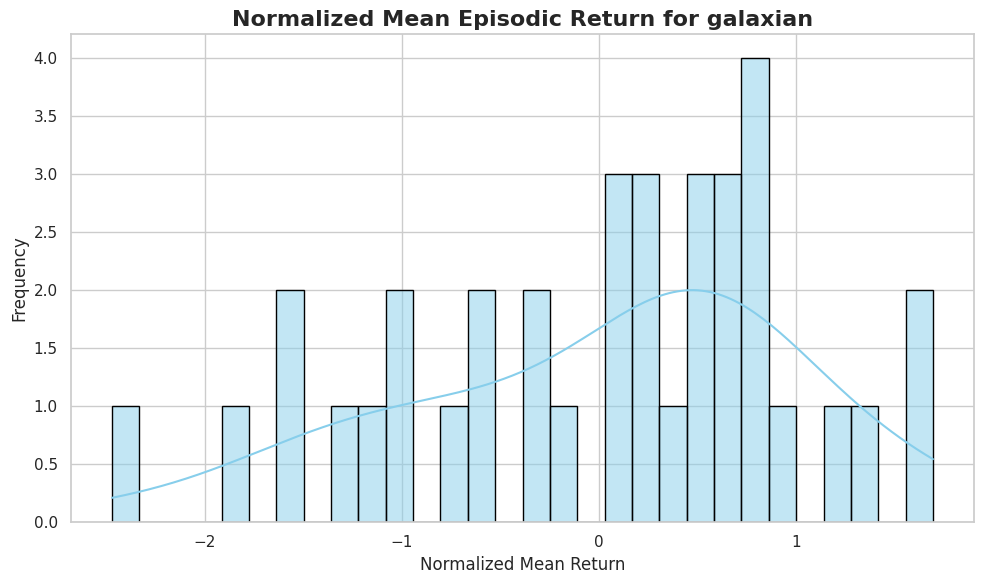

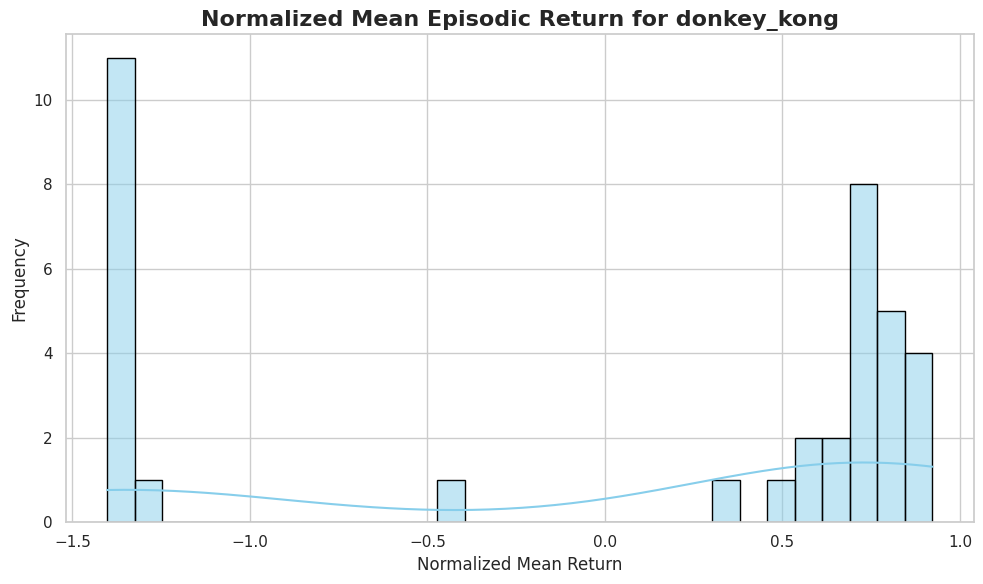

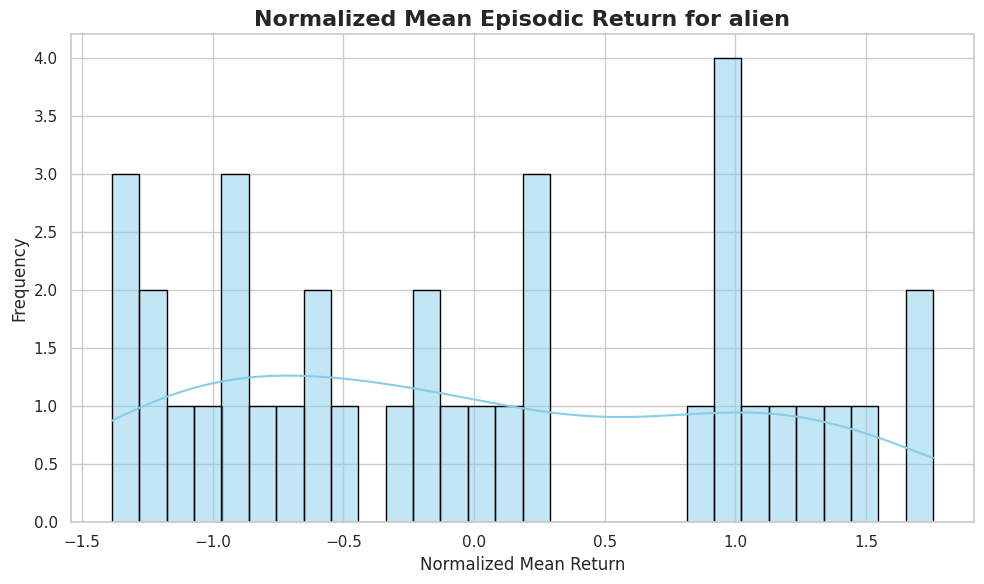

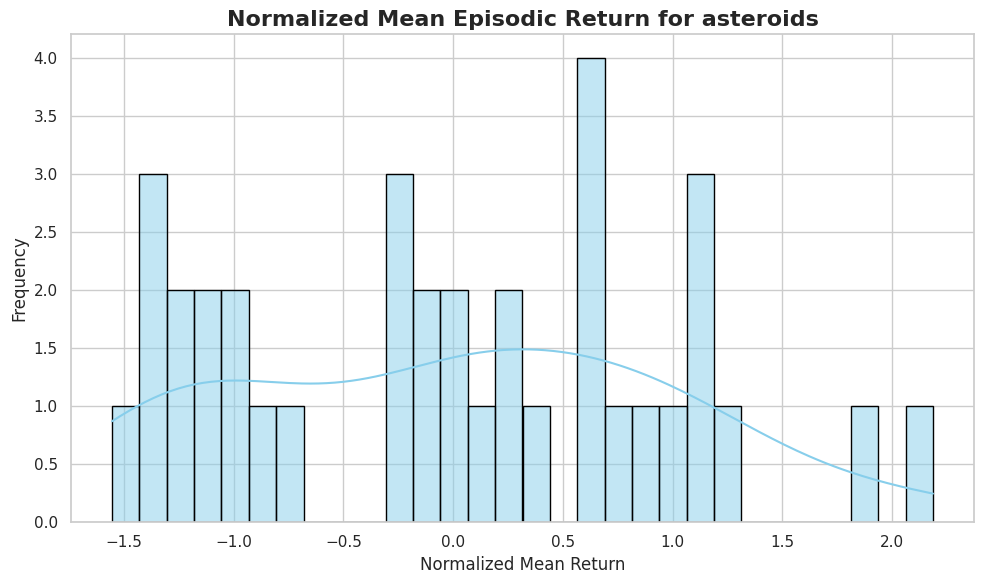

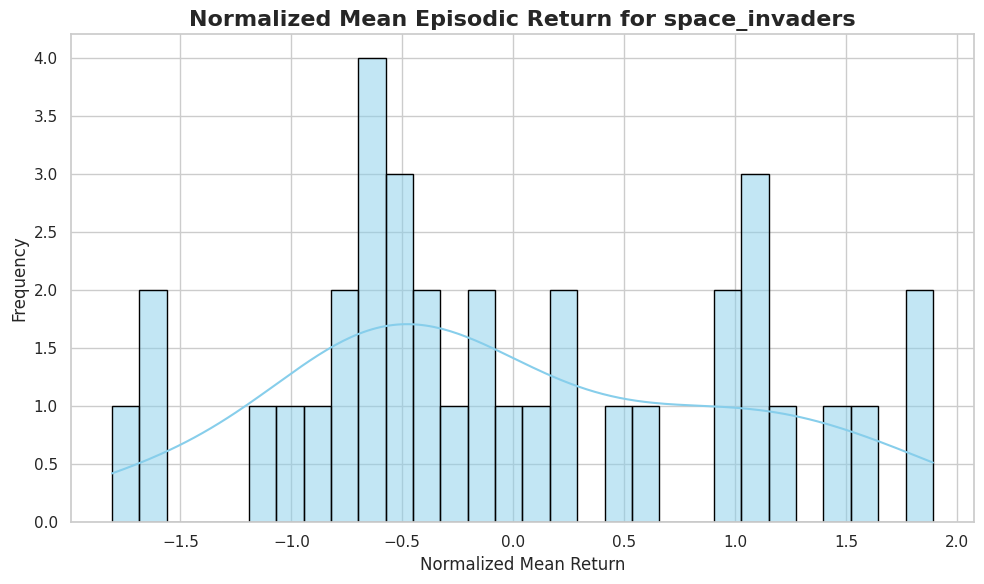

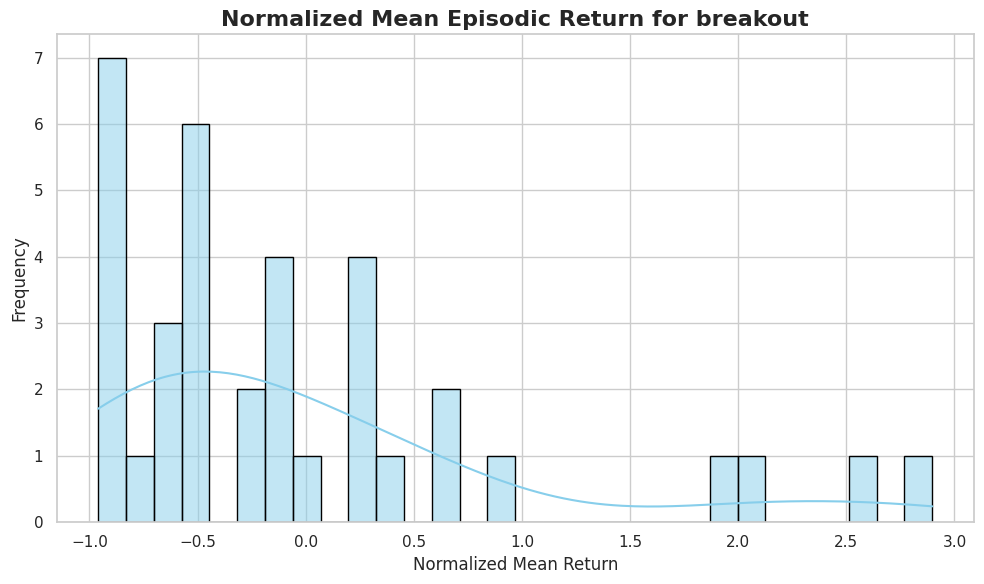

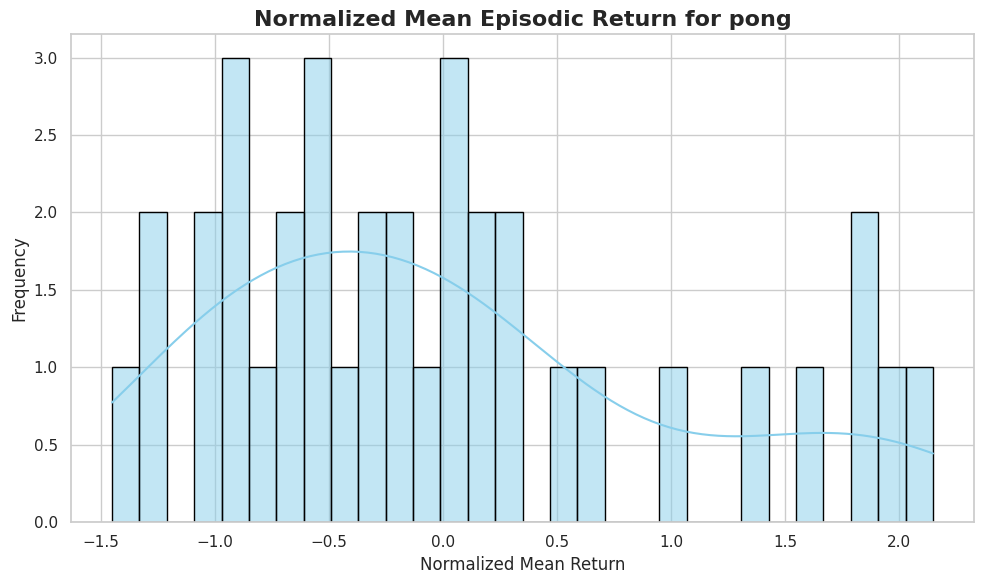

In [98]:
# Collect descriptive statistics into a single DataFrame
all_descriptive_stats = pd.concat(
    {env: res['descriptive_stats'] for env, res in analysis_results.items()},
    axis=0
).reset_index(level=1, drop=True).reset_index().rename(columns={'index': 'Environment'})

# Normalize Mean Return within each Environment to allow comparison across environments
all_descriptive_stats['Normalized Mean Return'] = all_descriptive_stats.groupby('Environment')['Mean Return'].transform(
    lambda x: (x - x.mean()) / x.std()
)

print(all_descriptive_stats.head())

# Plotting Normalized Mean Returns using a ridge plot
sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})
pal = sns.cubehelix_palette(len(all_descriptive_stats['Environment'].unique()), rot=-.25, light=.7)
g = sns.FacetGrid(all_descriptive_stats, row="Environment", hue="Environment", aspect=15, height=1, palette=pal)

# Draw the densities in a few steps
g.map(sns.kdeplot, "Normalized Mean Return",
      bw_adjust=.5, clip_on=False, fill=True, alpha=1, linewidth=1.5)
g.map(sns.kdeplot, "Normalized Mean Return", clip_on=False, color="w", lw=2, bw_adjust=.5)

# Add a horizontal line for each environment
g.map(plt.axhline, y=0, lw=2, clip_on=False)

# Define and use a simple function to label the plot in axes coordinates
def label(x, color, label):
    ax = plt.gca()
    ax.text(0, .2, label, fontweight="bold", color=color,
            ha="left", va="center", transform=ax.transAxes)

g.map(label, "Normalized Mean Return")

# Set the subplots to overlap
g.fig.subplots_adjust(hspace=-.25)

# Remove axes details that don't play well with overlap
g.set_titles("")
g.set(yticks=[], ylabel="")
g.despine(bottom=True, left=True)

# Add a title to the plot
g.fig.suptitle('Normalized Mean Episodic Return Across Configurations and Environments', fontsize=16, fontweight='bold')

# Save the plot as an SVG file
plt.savefig('normalized_mean_return_ridge_plot.svg', format='svg')

plt.show()

      Environment  F-Statistic       p-value  Eta Squared
0        galaxian    24.229155  7.321307e-28     0.921741
1     donkey_kong   167.539688  1.577577e-56     0.987870
2           alien    13.905048  2.882830e-20     0.872686
3       asteroids    25.075192  2.441653e-28     0.924181
4  space_invaders     8.182000  4.135335e-14     0.799090
5        breakout    40.562434  1.436020e-35     0.951095
6            pong     5.318363  1.278949e-09     0.723889


/tmp/ipykernel_2059/2442623798.py:13: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




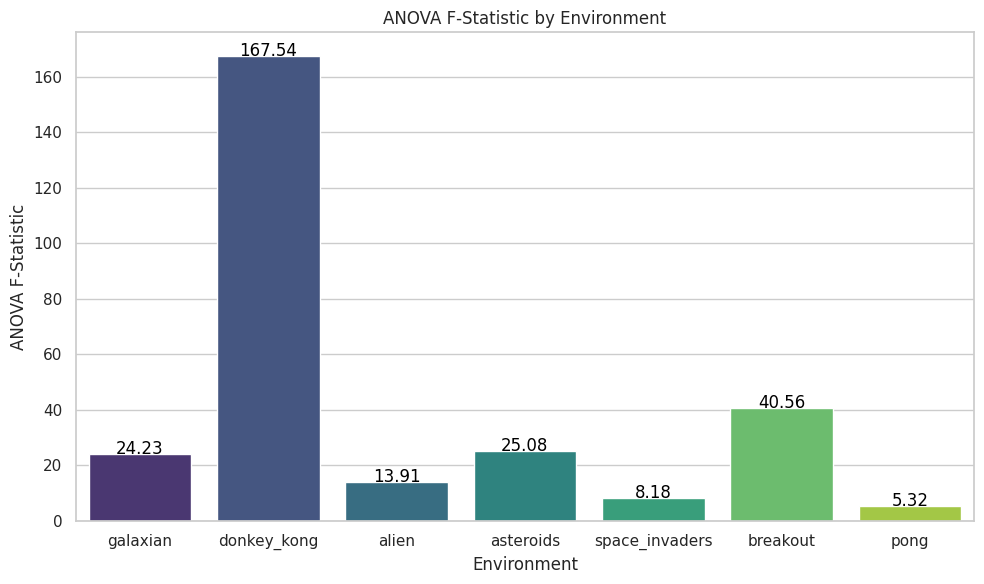

In [23]:
# Collect ANOVA F-Statistics and p-values
anova_summary = pd.DataFrame({
    'Environment': [env for env in environments],
    'F-Statistic': [res['anova']['F-Statistic'] if 'F-Statistic' in res['anova'] else np.nan for res in analysis_results.values()],
    'p-value': [res['anova']['p-value'] if 'p-value' in res['anova'] else np.nan for res in analysis_results.values()],
    'Eta Squared': [res['anova']['Eta_Squared'] if 'Eta_Squared' in res['anova'] else np.nan for res in analysis_results.values()]
})

print(anova_summary)

# Plotting F-Statistic with annotations
plt.figure(figsize=(10, 6))
ax = sns.barplot(data=anova_summary, x='Environment', y='F-Statistic', palette='viridis')
plt.xlabel('Environment')
plt.ylabel('ANOVA F-Statistic')
plt.title('ANOVA F-Statistic by Environment')

# Adding annotations
for index, row in anova_summary.iterrows():
    ax.text(index, row['F-Statistic'], f"{row['F-Statistic']:.2f}", color='black', ha="center")

plt.tight_layout()
plt.savefig('anova_f_statistic.svg', format='svg')  # Save as a vector plot
plt.show()

In [ ]:
# Collect stability statistics into a single DataFrame
all_stability_stats = pd.concat(
    [res['stability_stats'].assign(Environment=env) for env, res in analysis_results.items()],
    axis=0
).reset_index(drop=True)

# Normalize Mean Variance within each Environment to allow comparison across environments
all_stability_stats['Normalized Mean Variance'] = all_stability_stats.groupby('Environment')['Mean Variance'].transform(
    lambda x: (x - x.mean()) / x.std()
)

print(all_stability_stats.head())

# Plotting Normalized Mean Variance of Episodic Return using separate plots for each environment
sns.set_theme(style="whitegrid")
environments = all_stability_stats['Environment'].unique()

for env in environments:
    plt.figure(figsize=(10, 4))
    env_data = all_stability_stats[all_stability_stats['Environment'] == env]
    sns.histplot(env_data, x='Normalized Mean Variance', kde=True, color='skyblue', bins=20)
    plt.title(f'Normalized Mean Variance for {env}', fontsize=14, fontweight='bold')
    plt.ylabel('Density')
    plt.xlabel('Normalized Mean Variance')
    plt.tight_layout()
    plt.savefig(f'variance_histogram_{env}.svg', format='svg')  # Save each plot as a separate vector file
    plt.show()

                           configuration  Mean Variance  Std Dev Variance  \
0  Res:64x64_JPEG:100_Gray:0_FrameSkip:0   2.744487e+06     636335.102803   
1  Res:64x64_JPEG:100_Gray:0_FrameSkip:2   3.866105e+06     330118.628022   
2  Res:64x64_JPEG:100_Gray:0_FrameSkip:4   3.170530e+06     390357.812974   
3  Res:64x64_JPEG:100_Gray:1_FrameSkip:0   1.330523e+06     379045.348575   
4  Res:64x64_JPEG:100_Gray:1_FrameSkip:2   3.164412e+06     553327.199260   

  Environment  Normalized Mean Variance  
0    galaxian                 -0.217836  
1    galaxian                  0.873601  
2    galaxian                  0.196743  
3    galaxian                 -1.593751  
4    galaxian                  0.190790  


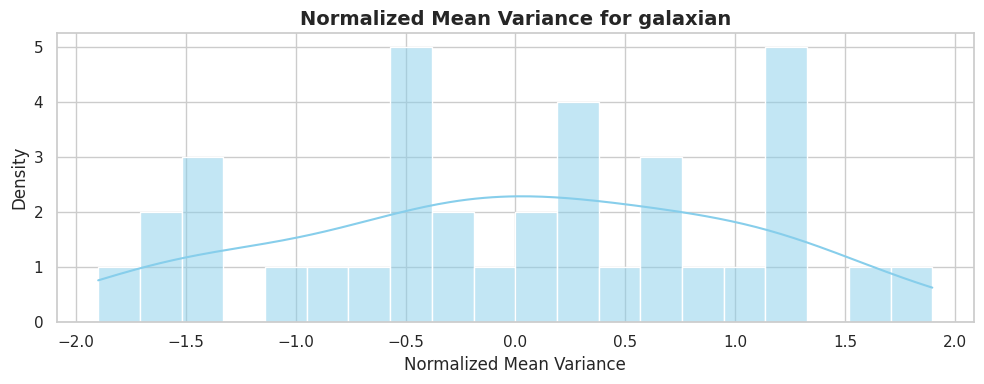

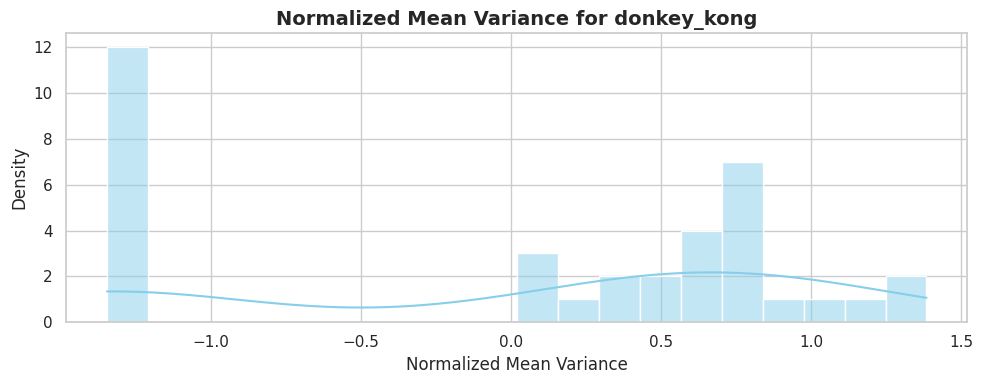

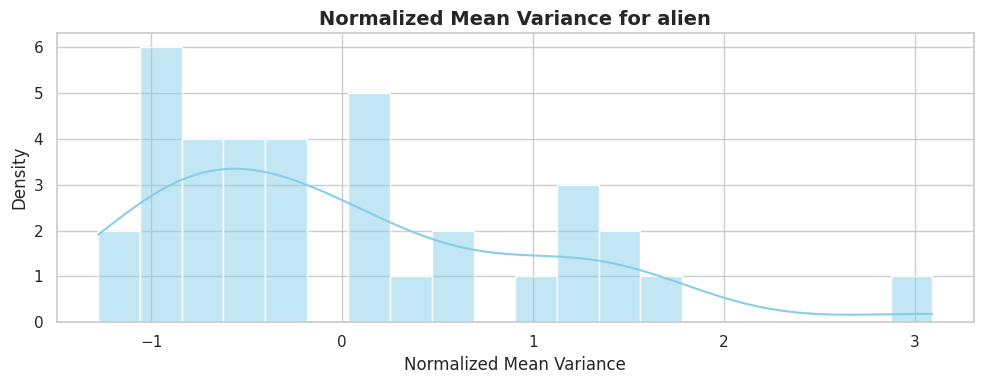

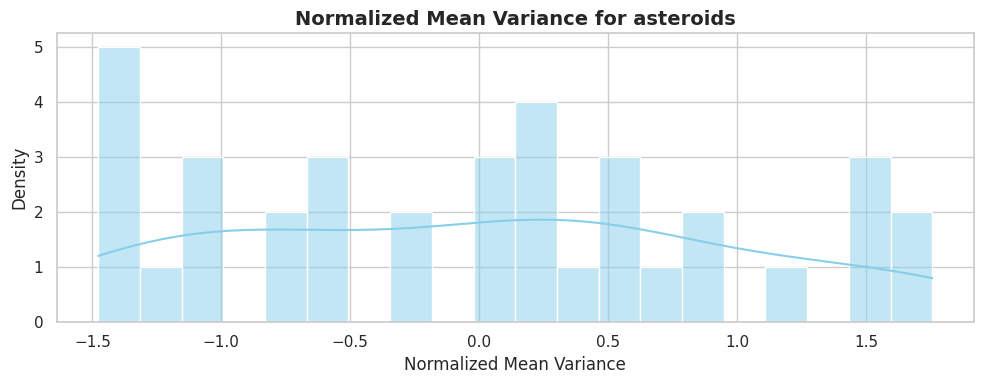

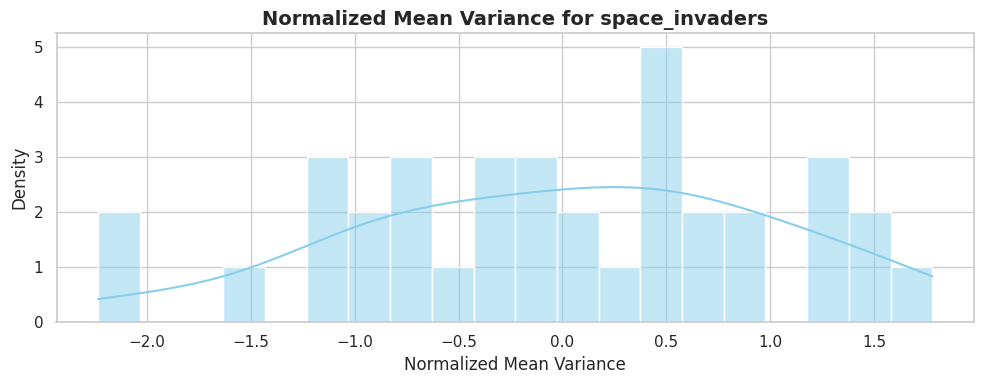

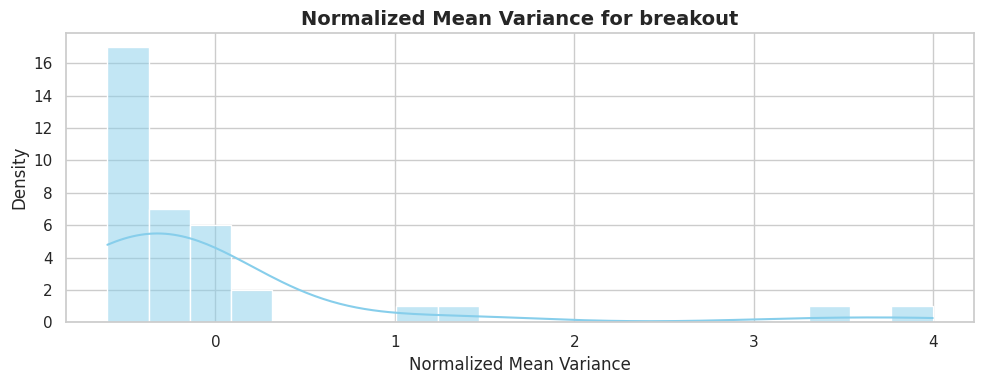

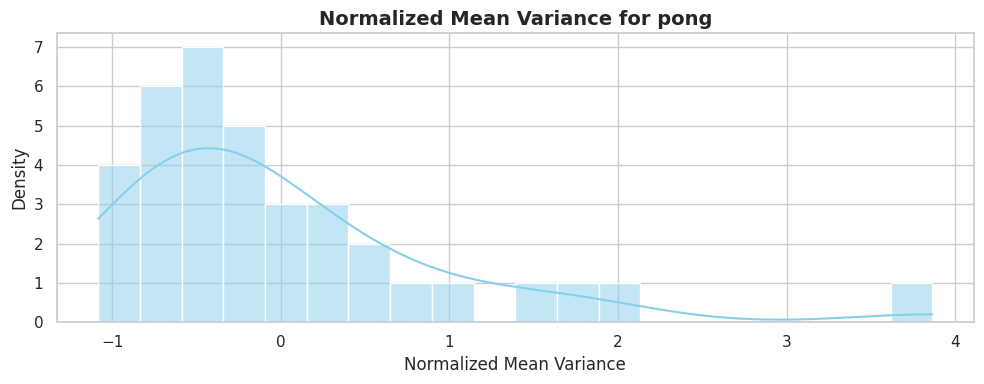

In [97]:
# Collect stability statistics into a single DataFrame
all_stability_stats = pd.concat(
    [res['stability_stats'].assign(Environment=env) for env, res in analysis_results.items()],
    axis=0
).reset_index(drop=True)

# Normalize Mean Variance within each Environment to allow comparison across environments
all_stability_stats['Normalized Mean Variance'] = all_stability_stats.groupby('Environment')['Mean Variance'].transform(
    lambda x: (x - x.mean()) / x.std()
)

print(all_stability_stats.head())

# Plotting Normalized Mean Variance of Episodic Return using a ridge plot
sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})
pal = sns.cubehelix_palette(len(all_stability_stats['Environment'].unique()), rot=-.25, light=.7)
g = sns.FacetGrid(all_stability_stats, row="Environment", hue="Environment", aspect=15, height=1, palette=pal)  # Increased height

# Draw the densities in a few steps
g.map(sns.kdeplot, "Normalized Mean Variance",
      bw_adjust=.5, clip_on=False,
      fill=True, alpha=1, linewidth=1.5)
g.map(sns.kdeplot, "Normalized Mean Variance", clip_on=False, color="w", lw=2, bw_adjust=.5)

# passing color=None to refline() uses the hue mapping
g.refline(y=0, linewidth=2, linestyle="-", color=None, clip_on=False)

# Define and use a simple function to label the plot in axes coordinates
def label(x, color, label):
    ax = plt.gca()
    ax.text(0, .2, label, fontweight="bold", color=color,
            ha="left", va="center", transform=ax.transAxes)

g.map(label, "Normalized Mean Variance")

# Set the subplots to overlap
g.figure.subplots_adjust(hspace=-.25)

# Remove axes details that don't play well with overlap
g.set_titles("")
g.set(yticks=[], ylabel="")
g.despine(bottom=True, left=True)

plt.xlabel('Normalized Mean Variance of Episodic Return (Last 10%)', fontsize=14, fontweight='bold')
plt.suptitle('Normalized Mean Variance of Episodic Return Across Configurations and Environments', fontsize=16, fontweight='bold')
plt.savefig('variance_ridgeplot.svg', format='svg')  # Save as a vector plot

# Adjust layout to prevent warnings about tight layout
plt.show()

  Environment                        Configuration 1  \
0    galaxian  Res:84x84_JPEG:100_Gray:0_FrameSkip:2   
1    galaxian  Res:84x84_JPEG:100_Gray:0_FrameSkip:2   
2    galaxian  Res:84x84_JPEG:100_Gray:0_FrameSkip:2   
3    galaxian  Res:84x84_JPEG:100_Gray:0_FrameSkip:2   
4    galaxian  Res:84x84_JPEG:100_Gray:0_FrameSkip:2   

                         Configuration 2  Cohen's d  Normalized Cohen's d  
0  Res:84x84_JPEG:100_Gray:0_FrameSkip:4  -0.257962             -1.040233  
1  Res:74x74_JPEG:100_Gray:0_FrameSkip:2   0.938262             -0.783759  
2  Res:84x84_JPEG:100_Gray:1_FrameSkip:2   1.453682             -0.673251  
3   Res:84x84_JPEG:50_Gray:0_FrameSkip:2   1.750724             -0.609565  
4  Res:74x74_JPEG:100_Gray:0_FrameSkip:4   1.300324             -0.706132  


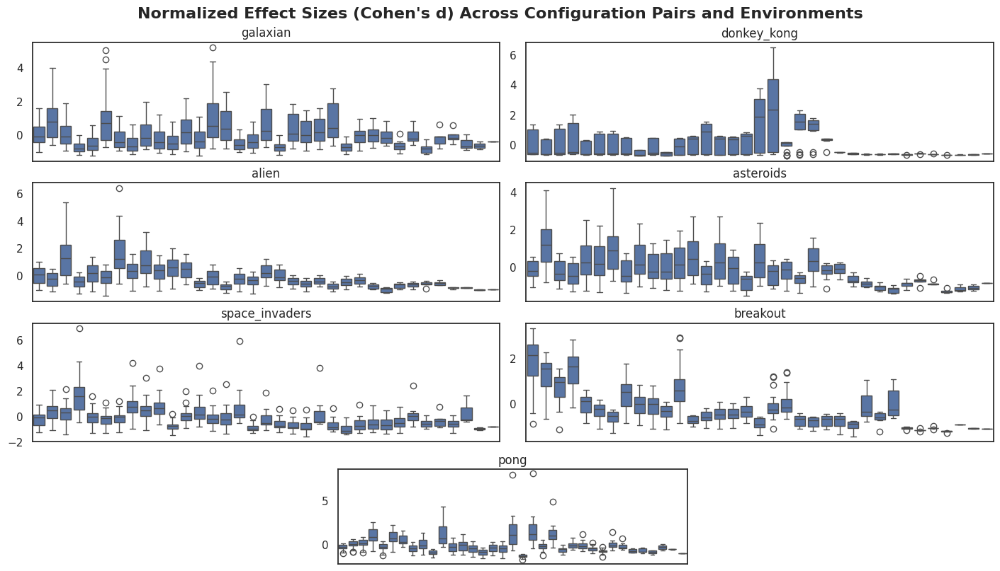

In [85]:
# Collect Cohen's d across environments
all_cohens_d = pd.concat(
    {env: res['t_tests'][['Configuration 1', 'Configuration 2', 'Cohen\'s d']] for env, res in analysis_results.items()},
    axis=0
).reset_index(level=1, drop=True).reset_index().rename(columns={'index': 'Environment'})

# Normalize Cohen's d within each Environment
all_cohens_d['Normalized Cohen\'s d'] = all_cohens_d.groupby('Environment')["Cohen's d"].transform(
    lambda x: (x - x.mean()) / x.std()
)

print(all_cohens_d.head())

# For better visualization, melt the DataFrame
all_cohens_d_melted = all_cohens_d.melt(
    id_vars=['Environment', 'Configuration 1', 'Configuration 2'],
    value_vars=["Normalized Cohen's d"],
    var_name='Metric',
    value_name='Value'
)

# Create subplots for each environment
environments = all_cohens_d['Environment'].unique()
num_envs = len(environments)
ncols = 2  # Number of columns for subplots
nrows = (num_envs + ncols - 1) // ncols  # Calculate number of rows needed

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(14, 8), constrained_layout=True)

# Flatten axes array for easy iteration
axes = axes.flatten()

# Plotting Normalized Cohen's d for each environment
for i, env in enumerate(environments):
    sns.boxplot(data=all_cohens_d_melted[all_cohens_d_melted['Environment'] == env],
                 x='Configuration 1', y='Value', ax=axes[i], dodge=True)
    axes[i].set_title(env)  # Set environment name as title
    axes[i].set_xticklabels([])  # Remove x-axis labels

# Center the last subplot if there are empty subplots
if num_envs % ncols != 0:
    for j in range(num_envs, nrows * ncols):
        fig.delaxes(axes[j])
    # Center the last plot if it's the only one in its row
    if num_envs % ncols == 1:
        axes[num_envs - 1].set_position([
            (axes[num_envs - 1].get_position().x0 + axes[num_envs].get_position().x0) / 2,
            axes[num_envs - 1].get_position().y0 - 0.10,  # Adjust y-position to prevent overlap
            axes[num_envs - 1].get_position().width,
            axes[num_envs - 1].get_position().height
        ])

# Remove x and y labels
for ax in axes:
    ax.set_xlabel('')
    ax.set_ylabel('')

plt.suptitle("Normalized Effect Sizes (Cohen's d) Across Configuration Pairs and Environments", fontsize=16, fontweight='bold')
plt.savefig('cohens_d_boxplot.svg', format='svg')  # Save as a vector plot
plt.show()

/tmp/ipykernel_2059/3989875790.py:9: SmallSampleWarning:

One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.

/tmp/ipykernel_2059/3989875790.py:53: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




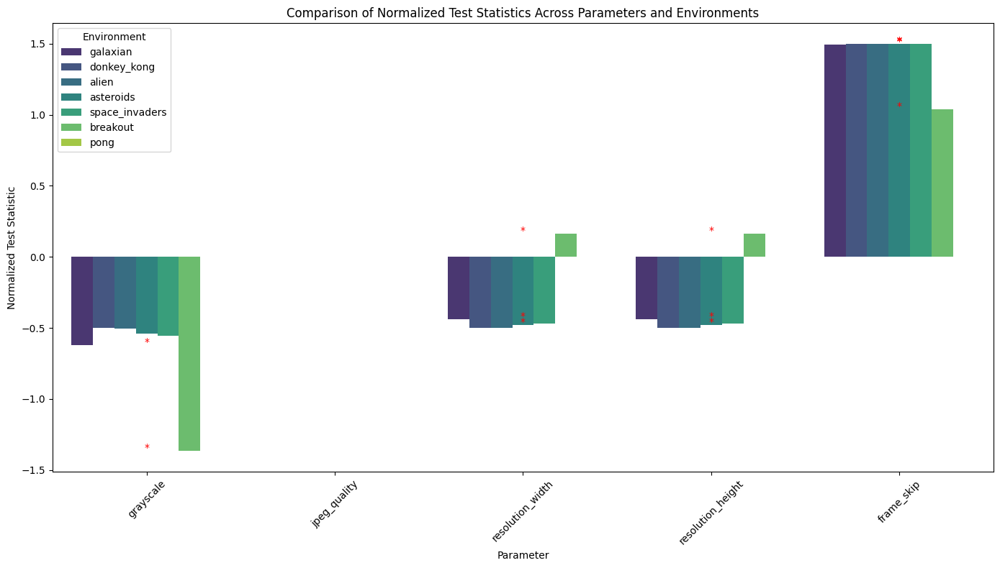

In [18]:
# Assuming 'df' is your DataFrame and it includes columns for each parameter and 'project'
parameters = ['grayscale', 'jpeg_quality', 'resolution_width', 'resolution_height', 'frame_skip']
environments = df['project'].unique()

# Function to perform T-test for binary parameters
def perform_t_test(data, param):
    group1 = data[data[param] == True]['avg_episodic_return_last_10']
    group2 = data[data[param] == False]['avg_episodic_return_last_10']
    t_stat, p_val = stats.ttest_ind(group1, group2, equal_var=False)
    return t_stat, p_val

# Function to perform ANOVA for categorical parameters
def perform_anova(data, param):
    groups = [group['avg_episodic_return_last_10'].values for name, group in data.groupby(param)]
    f_stat, p_val = stats.f_oneway(*groups)
    return f_stat, p_val

# Dictionary to store results
results = {env: {param: {} for param in parameters} for env in environments}

# Iterate over each environment and parameter
for env in environments:
    env_data = df[df['project'] == env]
    
    for param in parameters:
        if env_data[param].nunique() == 2:  # Binary parameter
            t_stat, p_val = perform_t_test(env_data, param)
            results[env][param] = {'Test': 'T-Test', 'Statistic': t_stat, 'p-value': p_val}
        else:  # Categorical parameter
            f_stat, p_val = perform_anova(env_data, param)
            results[env][param] = {'Test': 'ANOVA', 'Statistic': f_stat, 'p-value': p_val}

# Prepare data for plotting
plot_data = []
for env in environments:
    for param in parameters:
        plot_data.append({
            'Environment': env,
            'Parameter': param,
            'Statistic': results[env][param]['Statistic'],
            'Significant': results[env][param]['p-value'] < 0.05
        })

plot_df = pd.DataFrame(plot_data)

# Normalize the Statistic within each Environment
plot_df['Normalized Statistic'] = plot_df.groupby('Environment')['Statistic'].transform(
    lambda x: (x - x.mean()) / x.std()
)

# Plotting
plt.figure(figsize=(14, 8))
sns.barplot(data=plot_df, x='Parameter', y='Normalized Statistic', hue='Environment', ci=None, palette='viridis')

# Highlight significant results
for index, row in plot_df.iterrows():
    if row['Significant']:
        plt.text(index % len(parameters), row['Normalized Statistic'], '*', color='red', ha="center")

plt.xlabel('Parameter')
plt.ylabel('Normalized Test Statistic')
plt.title('Comparison of Normalized Test Statistics Across Parameters and Environments')
plt.xticks(rotation=45)
plt.legend(title='Environment')
plt.tight_layout()
plt.show()

T-Test Results Comparing Grayscale On vs Off per Environment:
      Environment  Grayscale On Mean  Grayscale Off Mean  T-Statistic  \
0        galaxian        4272.688889         4789.422222    -2.981145   
1     donkey_kong        2091.814815         2059.888889     0.114118   
2           alien         640.333333          632.132075     0.367668   
3       asteroids         501.496296          535.896296    -1.453550   
4  space_invaders         421.144444          437.687037    -1.886280   
5        breakout          32.546909           36.209259    -2.032257   
6            pong         -11.721840           -9.833388          NaN   

    P-Value  Cohen's d  Significant  
0  0.003563  -0.573722         True  
1  0.909360   0.021962        False  
2  0.713867   0.071139        False  
3  0.149184  -0.279736        False  
4  0.062058  -0.363015        False  
5  0.044657  -0.389784         True  
6       NaN  -0.445083        False  


/tmp/ipykernel_2059/2661200909.py:73: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.




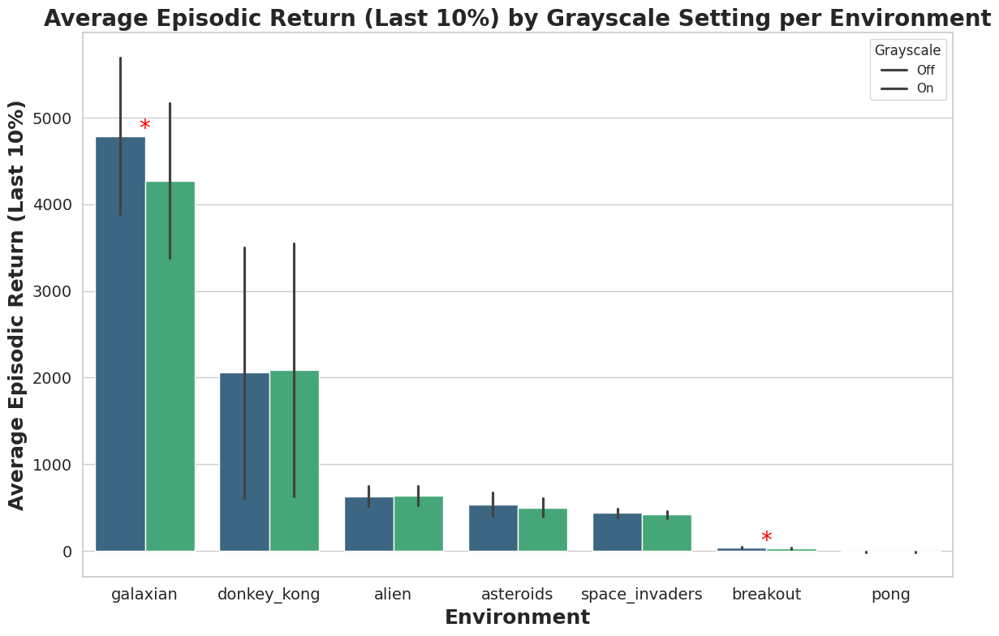

In [32]:
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure 'grayscale' is a boolean column
df['grayscale'] = df['grayscale'].astype(bool)

# Initialize a list to store results
t_test_results = []

# Get unique environments
environments = df['project'].unique()

for env in environments:
    env_df = df[df['project'] == env]
    
    # Split the data into grayscale on and off
    grayscale_on = env_df[env_df['grayscale'] == True]['avg_episodic_return_last_10']
    grayscale_off = env_df[env_df['grayscale'] == False]['avg_episodic_return_last_10']
    
    # Ensure there are enough samples in both groups
    if len(grayscale_on) < 2 or len(grayscale_off) < 2:
        print(f"Not enough data for environment: {env}")
        continue
    
    # Perform independent T-Test
    t_stat, p_val = stats.ttest_ind(grayscale_on, grayscale_off, equal_var=False)  # Welch's T-test
    
    # Calculate Cohen's d for effect size
    def cohens_d(x, y):
        nx = len(x)
        ny = len(y)
        dof = nx + ny - 2
        pooled_std = np.sqrt(((nx-1)*x.var(ddof=1) + (ny-1)*y.var(ddof=1)) / dof)
        return (x.mean() - y.mean()) / pooled_std
    
    d = cohens_d(grayscale_on, grayscale_off)
    
    # Append the results
    t_test_results.append({
        'Environment': env,
        'Grayscale On Mean': grayscale_on.mean(),
        'Grayscale Off Mean': grayscale_off.mean(),
        'T-Statistic': t_stat,
        'P-Value': p_val,
        "Cohen's d": d
    })

# Convert results to DataFrame
t_test_df = pd.DataFrame(t_test_results)

# Determine significance
t_test_df['Significant'] = t_test_df['P-Value'] < 0.05

# Display the results
print("T-Test Results Comparing Grayscale On vs Off per Environment:")
print(t_test_df)

# Visualization
plt.figure(figsize=(12, 8))
sns.set(style="whitegrid")

# Melt the DataFrame for easier plotting
melted_df = df[df['grayscale'].isin([True, False])].melt(
    id_vars=['project', 'grayscale'],
    value_vars=['avg_episodic_return_last_10'],
    var_name='Metric',
    value_name='Value'
)

sns.barplot(x='project', y='Value', hue='grayscale', data=melted_df, palette='viridis', ci='sd')

# Annotate significant results
for idx, row in t_test_df.iterrows():
    if row['Significant']:
        plt.text(idx, max(row['Grayscale On Mean'], row['Grayscale Off Mean']) + 1, '*', 
                 color='red', ha='center', fontsize=20)

plt.title('Average Episodic Return (Last 10%) by Grayscale Setting per Environment', fontsize=20, fontweight='bold')
plt.xlabel('Environment', fontsize=18, fontweight='bold')
plt.ylabel('Average Episodic Return (Last 10%)', fontsize=18, fontweight='bold')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(title='Grayscale', labels=['Off', 'On'])
plt.tight_layout()
plt.show()

# Optional: Save the results to a CSV file
t_test_df.to_csv('grayscale_t_test_results.csv', index=False)

1. Data Normalization
DataFrame with Normalized Average Episodic Return:


,project,avg_episodic_return_last_10,normalized_avg_return
427,galaxian,6413.4,2.016925
430,galaxian,6206.2,1.794911
431,galaxian,6061.4,1.639759
429,galaxian,5918.0,1.486106
419,galaxian,5917.6,1.485677



2. Statistical Testing on Normalized Data

Analyzing Parameter: Resolution_width


/tmp/ipykernel_2059/1258860573.py:65: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipykernel_2059/1258860573.py:66: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipykernel_2059/1258860573.py:69: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipykernel_2059/1258860573.py:65: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (c


Statistical Test Results (With Bonferroni Correction):
      Environment   Test  F-Statistic       P-Value  Eta_Squared  \
0        galaxian  ANOVA     5.171829  7.207223e-03     0.089677   
1     donkey_kong  ANOVA     0.307110  7.362284e-01     0.005816   
2           alien  ANOVA     0.787509  4.576706e-01     0.014918   
3       asteroids  ANOVA     3.790250  2.574078e-02     0.067334   
4  space_invaders  ANOVA     1.754432  1.780386e-01     0.032337   
5        breakout  ANOVA    22.583416  6.761072e-09     0.298788   
6            pong  ANOVA    44.740929  9.559624e-15     0.462482   

   P-Value Corrected  Significant (Bonferroni)  
0       5.045056e-02                     False  
1       1.000000e+00                     False  
2       1.000000e+00                     False  
3       1.801855e-01                     False  
4       1.000000e+00                     False  
5       4.732751e-08                      True  
6       6.691736e-14                      True  


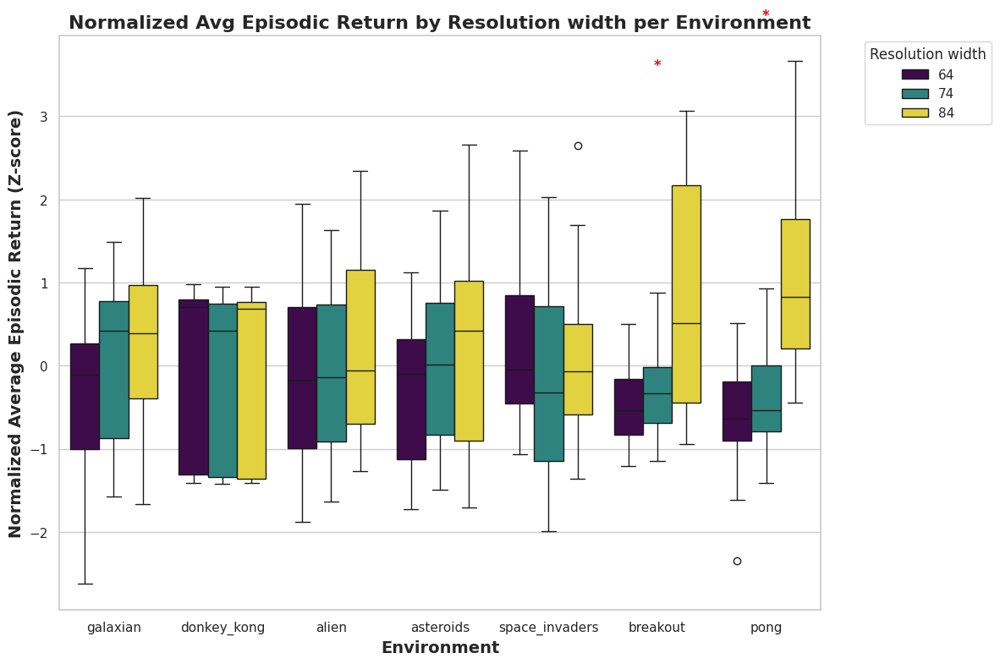


Analyzing Parameter: Resolution_height


/tmp/ipykernel_2059/1258860573.py:65: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipykernel_2059/1258860573.py:66: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipykernel_2059/1258860573.py:69: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipykernel_2059/1258860573.py:65: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (c


Statistical Test Results (With Bonferroni Correction):
      Environment   Test  F-Statistic       P-Value  Eta_Squared  \
0        galaxian  ANOVA     5.171829  7.207223e-03     0.089677   
1     donkey_kong  ANOVA     0.307110  7.362284e-01     0.005816   
2           alien  ANOVA     0.787509  4.576706e-01     0.014918   
3       asteroids  ANOVA     3.790250  2.574078e-02     0.067334   
4  space_invaders  ANOVA     1.754432  1.780386e-01     0.032337   
5        breakout  ANOVA    22.583416  6.761072e-09     0.298788   
6            pong  ANOVA    44.740929  9.559624e-15     0.462482   

   P-Value Corrected  Significant (Bonferroni)  
0       5.045056e-02                     False  
1       1.000000e+00                     False  
2       1.000000e+00                     False  
3       1.801855e-01                     False  
4       1.000000e+00                     False  
5       4.732751e-08                      True  
6       6.691736e-14                      True  


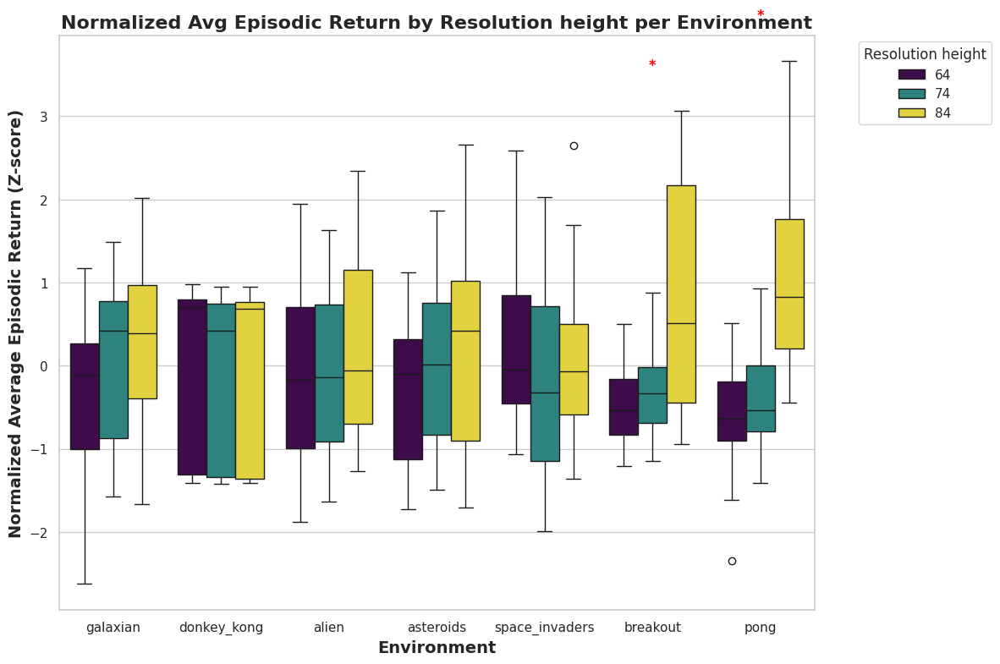


Analyzing Parameter: Jpeg_quality

Statistical Test Results (With Bonferroni Correction):
      Environment    Test  T-Statistic   P-Value  Cohen's d  \
0        galaxian  T-Test     2.989021  0.003479   0.575237   
1     donkey_kong  T-Test     0.115442  0.908313   0.022217   
2           alien  T-Test     0.521171  0.603346   0.100780   
3       asteroids  T-Test     0.252042  0.801507   0.048505   
4  space_invaders  T-Test     1.375252  0.171957   0.264667   
5        breakout  T-Test     0.257361  0.797397   0.049261   
6            pong  T-Test    -0.400520  0.689588  -0.077439   

   P-Value Corrected  Significant (Bonferroni)  
0           0.024353                      True  
1           1.000000                     False  
2           1.000000                     False  
3           1.000000                     False  
4           1.000000                     False  
5           1.000000                     False  
6           1.000000                     False  


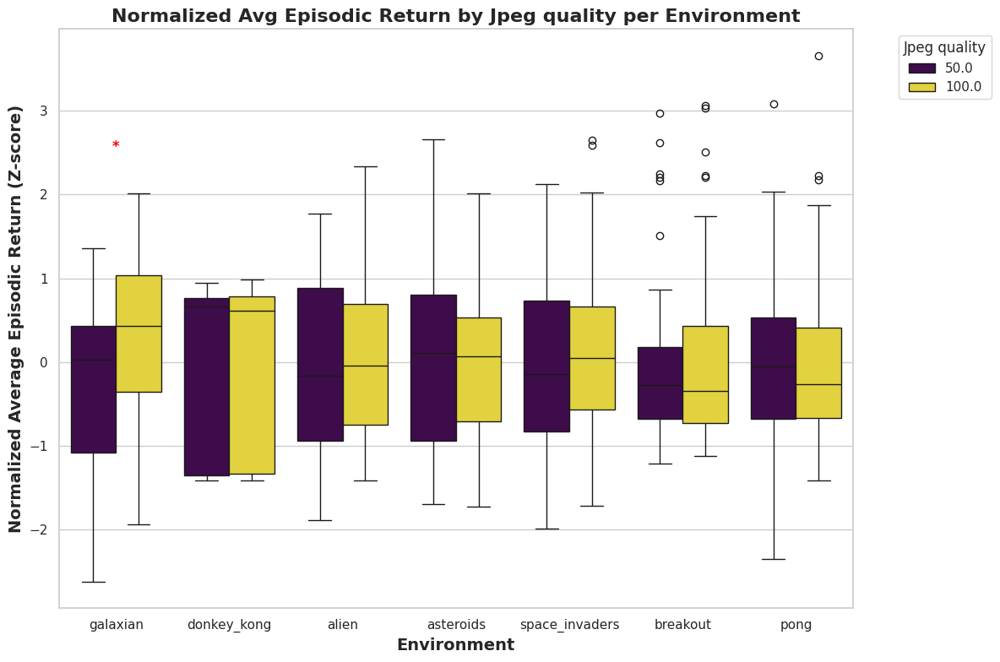


Analyzing Parameter: Frame_skip


/tmp/ipykernel_2059/1258860573.py:65: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipykernel_2059/1258860573.py:66: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipykernel_2059/1258860573.py:69: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipykernel_2059/1258860573.py:65: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (c


Statistical Test Results (With Bonferroni Correction):
      Environment   Test  F-Statistic       P-Value  Eta_Squared  \
0        galaxian  ANOVA    92.329896  7.299732e-24     0.637506   
1     donkey_kong  ANOVA  1016.462754  1.940119e-69     0.950887   
2           alien  ANOVA   199.824632  2.371740e-36     0.793507   
3       asteroids  ANOVA   184.717636  4.103433e-35     0.778684   
4  space_invaders  ANOVA    85.881757  7.974883e-23     0.620615   
5        breakout  ANOVA    36.618810  8.118297e-13     0.408606   
6            pong  ANOVA     6.172239  2.930578e-03     0.106103   

   P-Value Corrected  Significant (Bonferroni)  
0       5.109813e-23                      True  
1       1.358083e-68                      True  
2       1.660218e-35                      True  
3       2.872403e-34                      True  
4       5.582418e-22                      True  
5       5.682808e-12                      True  
6       2.051405e-02                      True  


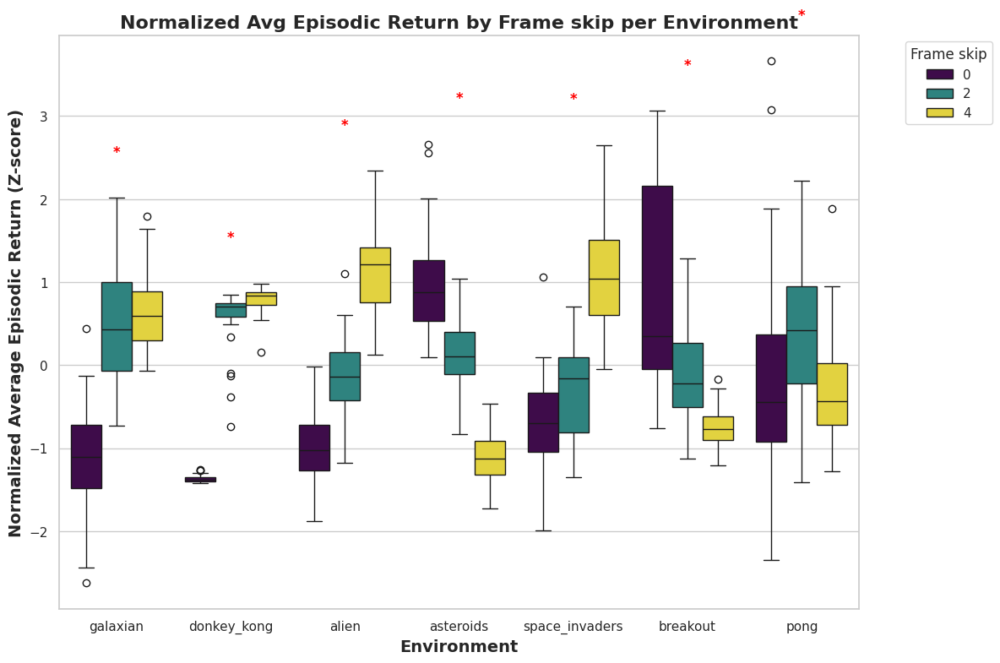


Analyzing Parameter: Grayscale

Statistical Test Results (With Bonferroni Correction):
      Environment    Test  T-Statistic   P-Value  Cohen's d  \
0        galaxian  T-Test    -2.981145  0.003563  -0.573722   
1     donkey_kong  T-Test     0.114118  0.909360   0.021962   
2           alien  T-Test     0.367668  0.713867   0.071139   
3       asteroids  T-Test    -1.453550  0.149184  -0.279736   
4  space_invaders  T-Test    -1.886280  0.062058  -0.363015   
5        breakout  T-Test    -2.032257  0.044657  -0.389784   
6            pong  T-Test          NaN       NaN  -0.445083   

   P-Value Corrected  Significant (Bonferroni)  
0           0.024938                      True  
1           1.000000                     False  
2           1.000000                     False  
3           1.000000                     False  
4           0.434407                     False  
5           0.312601                     False  
6                NaN                     False  


/tmp/ipykernel_2059/1258860573.py:221: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.




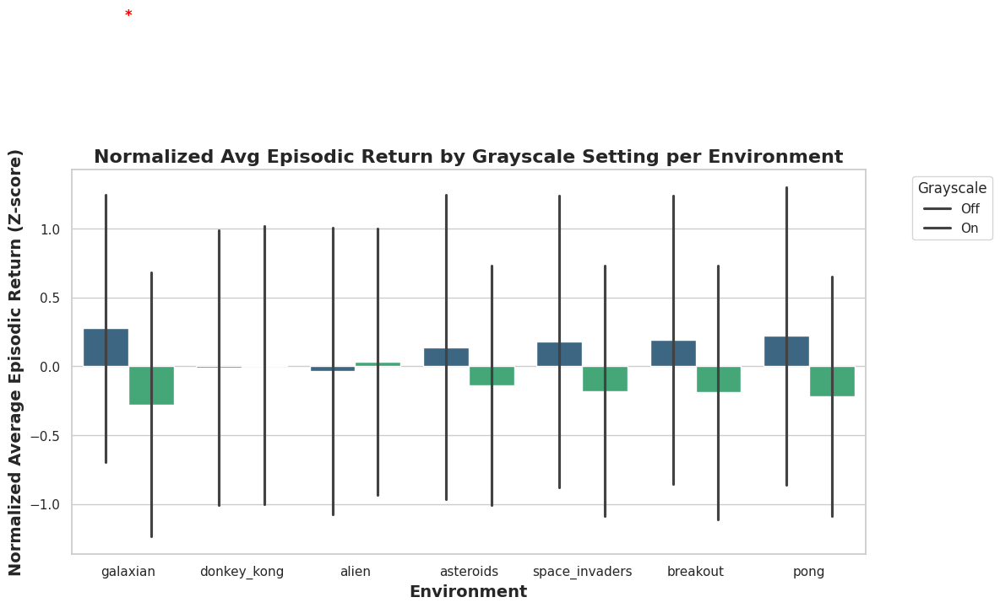


3. Generating Consolidated Grid of Comparative Graphs


/tmp/ipykernel_2059/1258860573.py:304: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_2059/1258860573.py:318: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipykernel_2059/1258860573.py:304: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_2059/1258860573.py:318: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/i

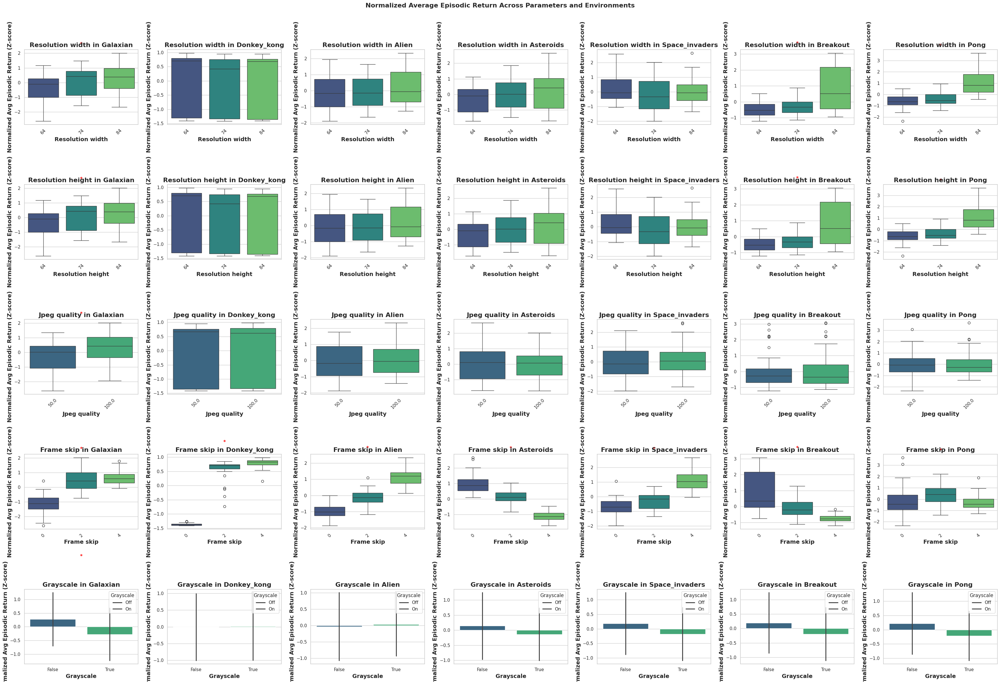

In [34]:
# Import necessary libraries
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from statsmodels.stats.multitest import multipletests

# Ensure plots are rendered inline
%matplotlib inline

# Load your DataFrame 'df'
# Assuming 'df' is already loaded. If not, load it accordingly.
# Example:
# df = pd.read_csv('your_data.csv')

# 1. Data Normalization
# ----------------------
print("1. Data Normalization")
# Normalize 'avg_episodic_return_last_10' per environment using Z-score normalization
df['normalized_avg_return'] = df.groupby('project')['avg_episodic_return_last_10'].transform(
    lambda x: (x - x.mean()) / x.std() if x.std() != 0 else 0
)

# Display the first few rows to verify
print("DataFrame with Normalized Average Episodic Return:")
display(df[['project', 'avg_episodic_return_last_10', 'normalized_avg_return']].head())

# 2. Statistical Testing on Normalized Data
# -----------------------------------------
print("\n2. Statistical Testing on Normalized Data")

# Define the parameters to analyze
parameters = ['resolution_width', 'resolution_height', 'jpeg_quality', 'frame_skip', 'grayscale']

# Get unique environments
environments = df['project'].unique()

# Initialize a dictionary to store analysis results
analysis_summary = {param: {} for param in parameters}

# Function to perform categorical analysis (ANOVA and Tukey's HSD)
def perform_categorical_analysis(env, env_df, parameter, metric='normalized_avg_return'):
    """
    Perform ANOVA and Tukey's HSD post-hoc test for categorical parameters within an environment.
    """
    # Drop rows with missing values in the parameter or metric
    analysis_df = env_df.dropna(subset=[parameter, metric])

    # Get unique categories
    categories = analysis_df[parameter].unique()
    num_categories = len(categories)

    if num_categories < 2:
        print(f"Environment: {env} | Parameter: {parameter} has less than two categories. Skipping analysis.")
        return None

    # Perform One-Way ANOVA if more than two categories
    if num_categories > 2:
        model = ols(f'{metric} ~ C({parameter})', data=analysis_df).fit()
        anova_table = sm.stats.anova_lm(model, typ=2)
        f_stat = anova_table['F'][0]
        p_val = anova_table['PR(>F)'][0]

        # Effect Size (Eta Squared)
        eta_sq = anova_table['sum_sq'][0] / anova_table['sum_sq'].sum()

        # Perform Tukey's HSD if ANOVA is significant
        tukey_summary = None
        if p_val < 0.05:
            tukey = pairwise_tukeyhsd(endog=analysis_df[metric],
                                      groups=analysis_df[parameter],
                                      alpha=0.05)
            tukey_summary = tukey.summary().as_text()

        # Store results
        analysis_summary[parameter][env] = {
            'Test': 'ANOVA',
            'F-Statistic': f_stat,
            'P-Value': p_val,
            'Eta_Squared': eta_sq,
            'Tukey': tukey_summary
        }

        return {
            'Environment': env,
            'Test': 'ANOVA',
            'F-Statistic': f_stat,
            'P-Value': p_val,
            'Eta_Squared': eta_sq
        }

    elif num_categories == 2:
        # If binary, perform T-Test
        group1 = analysis_df[analysis_df[parameter] == categories[0]][metric]
        group2 = analysis_df[analysis_df[parameter] == categories[1]][metric]

        t_stat, p_val = stats.ttest_ind(group1, group2, equal_var=False)

        # Calculate Cohen's d for effect size
        def cohens_d(x, y):
            nx = len(x)
            ny = len(y)
            dof = nx + ny - 2
            pooled_std = np.sqrt(((nx-1)*x.var(ddof=1) + (ny-1)*y.var(ddof=1)) / dof)
            return (x.mean() - y.mean()) / pooled_std if pooled_std != 0 else 0

        d = cohens_d(group1, group2)

        # Store results
        analysis_summary[parameter][env] = {
            'Test': 'T-Test',
            'T-Statistic': t_stat,
            'P-Value': p_val,
            "Cohen's d": d
        }

        return {
            'Environment': env,
            'Test': 'T-Test',
            'T-Statistic': t_stat,
            'P-Value': p_val,
            "Cohen's d": d
        }

# Function to perform binary analysis (T-Test and Cohen's d)
def perform_binary_analysis(env, env_df, parameter, metric='normalized_avg_return'):
    """
    Perform Independent T-Test and calculate Cohen's d for binary parameters within an environment.
    """
    # Split the data into two groups
    group1 = env_df[env_df[parameter] == True][metric]
    group2 = env_df[env_df[parameter] == False][metric]

    # Ensure there are enough samples in both groups
    if len(group1) < 2 or len(group2) < 2:
        print(f"Not enough data for environment: {env} | Parameter: {parameter}")
        return None

    # Perform independent T-Test
    t_stat, p_val = stats.ttest_ind(group1, group2, equal_var=False)  # Welch's T-test

    # Calculate Cohen's d for effect size
    def cohens_d(x, y):
        nx = len(x)
        ny = len(y)
        dof = nx + ny - 2
        pooled_std = np.sqrt(((nx-1)*x.var(ddof=1) + (ny-1)*y.var(ddof=1)) / dof)
        return (x.mean() - y.mean()) / pooled_std if pooled_std != 0 else 0

    d = cohens_d(group1, group2)

    # Store results
    analysis_summary[parameter][env] = {
        'Test': 'T-Test',
        'T-Statistic': t_stat,
        'P-Value': p_val,
        "Cohen's d": d
    }

    return {
        'Environment': env,
        'Test': 'T-Test',
        'T-Statistic': t_stat,
        'P-Value': p_val,
        "Cohen's d": d
    }

# Function to analyze a single parameter across all environments
def analyze_parameter_across_environments(parameter):
    """
    Analyze a single parameter across all environments.
    Performs the appropriate statistical test based on parameter type and stores results.
    Generates visualizations for the parameter across environments.
    """
    print(f"\nAnalyzing Parameter: {parameter.capitalize()}")

    results = []

    for env in environments:
        env_df = df[df['project'] == env]

        if parameter == 'grayscale':
            # Binary parameter: Perform T-Test
            result = perform_binary_analysis(env, env_df, parameter)
            if result:
                results.append(result)
        else:
            # Categorical parameter: Perform ANOVA or T-Test based on number of categories
            analysis_result = perform_categorical_analysis(env, env_df, parameter)
            if analysis_result:
                results.append(analysis_result)

    # Convert results to DataFrame
    results_df = pd.DataFrame(results)

    # Apply Bonferroni Correction for multiple comparisons
    num_tests = len(results_df)
    if num_tests > 0:
        p_vals = results_df['P-Value'].values
        reject, pvals_corrected, _, _ = multipletests(p_vals, method='bonferroni')
        results_df['P-Value Corrected'] = pvals_corrected
        results_df['Significant (Bonferroni)'] = reject
    else:
        results_df['P-Value Corrected'] = []
        results_df['Significant (Bonferroni)'] = []

    # Display the results
    print("\nStatistical Test Results (With Bonferroni Correction):")
    print(results_df)

    # Visualization: Depending on parameter type
    plt.figure(figsize=(12, 8))
    sns.set(style="whitegrid")

    if parameter == 'grayscale':
        # Barplot for binary parameter
        sns.barplot(x='project', y='normalized_avg_return', hue='grayscale', data=df, ci='sd', palette='viridis')
        plt.title(f'Normalized Avg Episodic Return by Grayscale Setting per Environment', fontsize=16, fontweight='bold')
        plt.xlabel('Environment', fontsize=14, fontweight='bold')
        plt.ylabel('Normalized Average Episodic Return (Z-score)', fontsize=14, fontweight='bold')
        plt.legend(title='Grayscale', labels=['Off', 'On'], bbox_to_anchor=(1.05, 1), loc='upper left')
        
        # Annotate significant results
        for idx, row in results_df.iterrows():
            env = row['Environment']
            if row['Significant (Bonferroni)']:
                # Get the maximum normalized return for positioning the asterisk
                max_norm_return = df[df['project'] == env]['normalized_avg_return'].max()
                plt.text(idx, max_norm_return + 0.5, '*', color='red', ha='center', fontsize=12, fontweight='bold')
    else:
        # Boxplot for categorical parameter
        sns.boxplot(x='project', y='normalized_avg_return', hue=parameter, data=df, palette='viridis')
        plt.title(f'Normalized Avg Episodic Return by {parameter.replace("_", " ").capitalize()} per Environment', fontsize=16, fontweight='bold')
        plt.xlabel('Environment', fontsize=14, fontweight='bold')
        plt.ylabel('Normalized Average Episodic Return (Z-score)', fontsize=14, fontweight='bold')
        plt.legend(title=parameter.replace('_', ' ').capitalize(), bbox_to_anchor=(1.05, 1), loc='upper left')
        
        # Annotate significant results
        for idx, row in results_df.iterrows():
            env = row['Environment']
            if row['Significant (Bonferroni)']:
                # Get the maximum normalized return for positioning the asterisk
                max_norm_return = df[df['project'] == env]['normalized_avg_return'].max()
                plt.text(idx, max_norm_return + 0.5, '*', color='red', ha='center', fontsize=12, fontweight='bold')

    plt.tight_layout()
    plt.savefig(f'{parameter}_analysis.svg', format='svg')  # Save as vector plot
    plt.show()

# Function to perform all analyses and generate plots
def analyze_and_plot_all_parameters():
    """
    Analyze all specified parameters across all environments and generate corresponding plots.
    """
    for param in parameters:
        analyze_parameter_across_environments(param)

# Execute the analysis and plotting for all parameters
analyze_and_plot_all_parameters()

# 3. Consolidated Grid of Comparative Graphs (Optional Advanced Visualization)
# -----------------------------------------------------------------------------

print("\n3. Generating Consolidated Grid of Comparative Graphs")

# Set up the matplotlib figure with subplots grid
num_params = len(parameters)
num_envs = len(environments)
fig, axes = plt.subplots(num_params, num_envs, figsize=(5*num_envs, 5*num_params), sharey=False)
fig.subplots_adjust(hspace=0.4, wspace=0.4)

for i, param in enumerate(parameters):
    for j, env in enumerate(environments):
        ax = axes[i, j] if num_params > 1 else axes[j]
        env_df = df[df['project'] == env]

        if param == 'grayscale':
            # Binary parameter: Barplot
            sns.barplot(x=param, y='normalized_avg_return', hue='grayscale', data=env_df, ci='sd', palette='viridis', ax=ax)
            ax.set_title(f'{param.replace("_", " ").capitalize()} in {env.capitalize()}', fontsize=16, fontweight='bold')
            ax.set_xlabel(param.replace('_', ' ').capitalize(), fontsize=14, fontweight='bold')
            ax.set_ylabel('Normalized Avg Episodic Return (Z-score)', fontsize=14, fontweight='bold')
            ax.legend(title='Grayscale', labels=['Off', 'On'], loc='upper right')

            # Perform T-Test
            group1 = env_df[param] == True
            group2 = env_df[param] == False
            grayscale_on = env_df[group1]['normalized_avg_return']
            grayscale_off = env_df[group2]['normalized_avg_return']

            if len(grayscale_on) >=2 and len(grayscale_off) >=2:
                t_stat, p_val = stats.ttest_ind(grayscale_on, grayscale_off, equal_var=False)
                # Apply Bonferroni correction
                alpha = 0.05 / len(parameters)  # Adjust alpha for multiple comparisons
                if p_val < alpha:
                    max_norm_return = env_df['normalized_avg_return'].max()
                    ax.text(0.5, max_norm_return + 0.5, '*', color='red', ha='center', fontsize=12, fontweight='bold')
        else:
            # Categorical parameter: Boxplot
            sns.boxplot(x=param, y='normalized_avg_return', data=env_df, palette='viridis', ax=ax)
            ax.set_title(f'{param.replace("_", " ").capitalize()} in {env.capitalize()}', fontsize=16, fontweight='bold')
            ax.set_xlabel(param.replace('_', ' ').capitalize(), fontsize=14, fontweight='bold')
            ax.set_ylabel('Normalized Avg Episodic Return (Z-score)', fontsize=14, fontweight='bold')
            ax.tick_params(axis='x', rotation=45)

            # Perform ANOVA or T-Test
            analysis_df = env_df.dropna(subset=[param, 'normalized_avg_return'])
            categories = analysis_df[param].unique()
            num_categories = len(categories)

            if num_categories > 2:
                model = ols(f'normalized_avg_return ~ C({param})', data=analysis_df).fit()
                anova_table = sm.stats.anova_lm(model, typ=2)
                p_val = anova_table['PR(>F)'][0]
                # Apply Bonferroni correction
                alpha = 0.05 / len(parameters)  # Adjust alpha for multiple comparisons
                if p_val < alpha:
                    max_norm_return = env_df['normalized_avg_return'].max()
                    ax.text(len(categories)/2 - 0.5, max_norm_return + 0.5, '*', color='red', ha='center', fontsize=12, fontweight='bold')
            elif num_categories ==2:
                group1 = analysis_df[analysis_df[param] == categories[0]]['normalized_avg_return']
                group2 = analysis_df[analysis_df[param] == categories[1]]['normalized_avg_return']
                t_stat, p_val = stats.ttest_ind(group1, group2, equal_var=False)
                # Apply Bonferroni correction
                alpha = 0.05 / len(parameters)  # Adjust alpha for multiple comparisons
                if p_val < alpha:
                    max_norm_return = env_df['normalized_avg_return'].max()
                    ax.text(0.5, max_norm_return + 0.5, '*', color='red', ha='center', fontsize=12, fontweight='bold')

        # Remove legends for all but the first subplot in each row
        if j > 0 and param != 'grayscale':
            legend = ax.get_legend()
            if legend is not None:
                legend.remove()

plt.suptitle('Normalized Average Episodic Return Across Parameters and Environments', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.savefig('consolidated_grid_analysis.svg', format='svg')  # Save as vector plot
plt.show()

Fetching runs for project: sayf/atari-set-3 (breakout)


/tmp/ipykernel_2059/3732537110.py:33: DeprecationWarning:

`trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.



Fetching runs for project: sayf/atari-set-4 (alien)
Fetching runs for project: sayf/atari-set-5 (donkey_kong)
Fetching runs for project: sayf/atari-set-6 (galaxian)
Fetching runs for project: sayf/atari-set-7 (asteroids)
Fetching runs for project: sayf/atari-set-8 (space_invaders)
Fetching runs for project: sayf/atari-set-9 (pong)
Grouped and Averaged Sample Efficiency by Project and Tag
      project                                               tags  \
179  galaxian                      resolution_84x84_frame_skip_4   
178  galaxian                      resolution_84x84_frame_skip_2   
176  galaxian                      resolution_74x74_frame_skip_4   
175  galaxian                      resolution_74x74_frame_skip_2   
149  galaxian  grayscale_jpeg_quality_50_resolution_74x74_fra...   
..        ...                                                ...   
192      pong            grayscale_resolution_74x74_frame_skip_0   
183      pong  grayscale_jpeg_quality_50_resolution_74x74_fra... 

/tmp/ipykernel_2059/3732537110.py:144: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_2059/3732537110.py:144: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_2059/3732537110.py:144: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_2059/3732537110.py:144: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_2059/3732537110.py:144: FutureWarning:



Passing `palette` without assigning `hue` is de

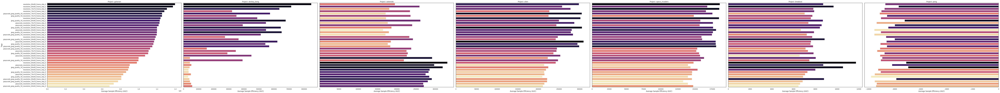

In [87]:
import wandb
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import numpy as np
import scipy.stats as stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from itertools import combinations
import os

# Function to compute sample efficiency as AUC
def compute_sample_efficiency(history_df):
    """
    Compute the Area Under the Curve (AUC) for the episodic return.

    Parameters:
    - history_df (DataFrame): DataFrame containing the 'charts/episodic_return' over training steps.

    Returns:
    - float: Computed AUC value.
    """
    if 'charts/episodic_return' not in history_df.columns:
        return None

    # Assuming each row represents a training step or episode
    # Compute AUC using the trapezoidal rule
    episodic_returns = history_df['charts/episodic_return'].values
    steps = np.arange(len(episodic_returns))

    auc = np.trapz(episodic_returns, steps)
    return auc

# Initialize wandb API
api = wandb.Api()

# Define your projects
projects = {
    "breakout": "sayf/atari-set-3",
    "alien": "sayf/atari-set-4",
    "donkey_kong": "sayf/atari-set-5",
    "galaxian": "sayf/atari-set-6",
    "asteroids": "sayf/atari-set-7",
    "space_invaders": "sayf/atari-set-8",
    "pong": "sayf/atari-set-9"
}

# Prepare a list to hold all run information across projects
all_run_data = []

# Iterate through each project and collect run data
for game, project in projects.items():
    print(f"Fetching runs for project: {project} ({game})")
    runs = api.runs(project)
    
    for run in runs:
        tags = run.tags  # Get tags for the run
        config = run.config  # Get config for the run
        history = run.history(keys=["charts/episodic_return"], pandas=True)  # Get episodic return data as a pandas DataFrame

        run_info = {
            "run_id": run.id,
            "project": game,  # Add the game/project name
            "tags": tags if tags else ["untagged"],
            "config": config  # Add the config to the run_info
        }

        if "charts/episodic_return" in history.columns and not history.empty:
            total_steps = len(history)
            if total_steps == 0:
                run_info["avg_episodic_return_last_10"] = None
                run_info["var_episodic_return_last_10"] = None
                run_info["sample_efficiency"] = None
            else:
                # Calculate the index that marks the beginning of the last 10%
                last_10_percent_index = max(int(total_steps * 0.9), 0)
                # Slice the DataFrame to get the last 10% of the episodic return data
                last_10_percent_history = history["charts/episodic_return"].iloc[last_10_percent_index:]
                # Calculate the average episodic return for the last 10%
                avg_episodic_return_last_10 = last_10_percent_history.mean()
                run_info["avg_episodic_return_last_10"] = avg_episodic_return_last_10

                var_episodic_return_last_10 = last_10_percent_history.var()
                run_info["var_episodic_return_last_10"] = var_episodic_return_last_10

                # Compute Sample Efficiency (AUC) over entire history
                sample_efficiency = compute_sample_efficiency(history)
                run_info["sample_efficiency"] = sample_efficiency
        else:
            run_info["avg_episodic_return_last_10"] = None
            run_info["var_episodic_return_last_10"] = None
            run_info["sample_efficiency"] = None

        all_run_data.append(run_info)

# Create a DataFrame from the collected run data
df = pd.DataFrame(all_run_data)

# Optionally, save the DataFrame to a CSV file for future use
csv_file = "combined_run_data.csv"
df.to_csv(csv_file, index=False)

# Plot Sample Efficiency

# Ensure 'sample_efficiency' column exists
if 'sample_efficiency' in df.columns:
    # Handle missing values if any
    filtered_df = df.dropna(subset=['sample_efficiency'])

    # Sort the DataFrame by 'sample_efficiency' in descending order
    filtered_df = filtered_df.sort_values(by="sample_efficiency", ascending=False)

    # Check if 'tags' column exists and is not empty for grouping
    if "tags" in filtered_df.columns and not filtered_df["tags"].empty:
        # Explode the tags list to allow grouping by each tag individually
        df_exploded = filtered_df.explode("tags")

        # Group by tags and calculate the average sample efficiency and count of runs for each tag
        grouped_df = (
            df_exploded.groupby(["project", "tags"])
            .agg(
                avg_sample_efficiency=("sample_efficiency", "mean"),
                run_count=("run_id", "count")
            )
            .reset_index()
        )

        # Sort the DataFrame by average sample efficiency in descending order
        grouped_df = grouped_df.sort_values(by="avg_sample_efficiency", ascending=False)

        # Display the results
        print("Grouped and Averaged Sample Efficiency by Project and Tag")
        print(grouped_df)

        # Plot the results in subplots according to project
        projects = grouped_df["project"].unique()
        num_projects = len(projects)
        fig, axes = plt.subplots(nrows=1, ncols=num_projects, figsize=(15 * num_projects, 10), sharey=True)

        for ax, project in zip(axes, projects):
            project_df = grouped_df[grouped_df["project"] == project]
            sns.barplot(data=project_df, x="avg_sample_efficiency", y="tags", ax=ax, palette="magma")
            ax.set_title(f"Project: {project}")
            ax.set_xlabel("Average Sample Efficiency (AUC)")
            ax.set_ylabel("Tags")

        plt.tight_layout()
        plt.savefig('sample_efficiency_project_tag.svg', format='svg')  # Save as SVG for vector format
        plt.show()
    else:
        print("No tags found in the runs. Unable to group by tags.")
        # Display the ungrouped results
        print("Averaged Sample Efficiency (AUC) by Run")
        print(filtered_df[["run_id", "sample_efficiency"]])

        # Plot the results
        plt.figure(figsize=(12, 8))  # Increase figure size for better readability
        plt.barh(filtered_df["run_id"], filtered_df["sample_efficiency"], color="salmon")  # Use horizontal bar plot
        plt.xlabel("Sample Efficiency (AUC)")
        plt.ylabel("Run ID")
        plt.title("Sample Efficiency (AUC) by Run")
        plt.tight_layout()
        plt.savefig('sample_efficiency_by_run.svg', format='svg')  # Save as SVG for vector format
        plt.show()
else:
    print("No 'sample_efficiency' data found in any of the runs.")

/tmp/ipykernel_2059/52618571.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



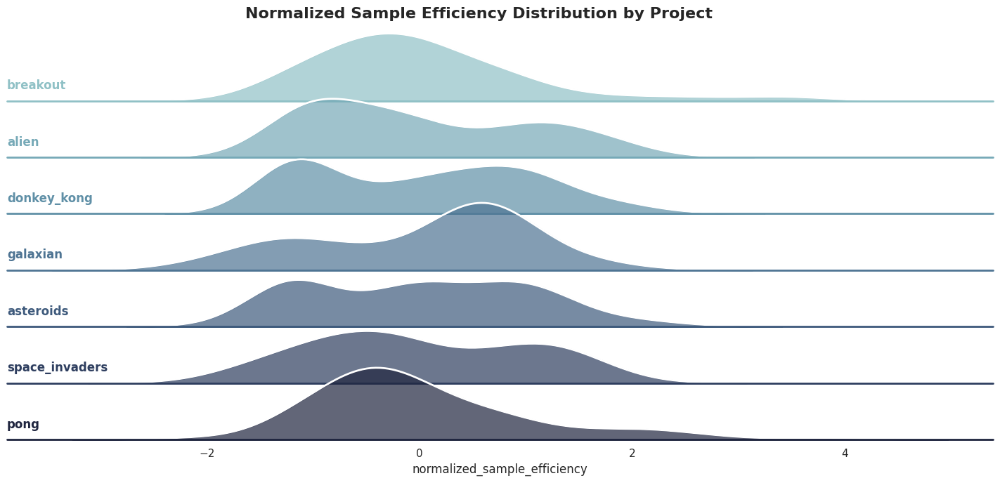

In [91]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure 'sample_efficiency' and 'project' columns exist
if 'sample_efficiency' in df.columns and 'project' in df.columns:
    # Handle missing values
    filtered_df = df.dropna(subset=['sample_efficiency', 'project'])
    
    # Normalize 'sample_efficiency' per environment using Z-score normalization
    filtered_df['normalized_sample_efficiency'] = filtered_df.groupby('project')['sample_efficiency'].transform(
        lambda x: (x - x.mean()) / x.std() if x.std() != 0 else 0
    )
    
    # Set the aesthetic style of the plots
    sns.set(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})
    
    # Define the color palette based on the number of unique projects
    unique_projects = filtered_df['project'].unique()
    palette = sns.cubehelix_palette(len(unique_projects), rot=-0.25, light=0.7)
    
    # Create a FacetGrid for the ridge plot
    g = sns.FacetGrid(filtered_df, row="project", hue="project", aspect=15, height=1, palette=palette)
    
    # Draw the densities in a few steps
    g.map(sns.kdeplot, "normalized_sample_efficiency",
          bw_adjust=1, clip_on=False,
          fill=True, alpha=0.7, linewidth=1.5)
    g.map(sns.kdeplot, "normalized_sample_efficiency",
          bw_adjust=1, clip_on=False,
          color="w", lw=2)
    
    # Add a horizontal line for each project
    g.map(plt.axhline, y=0, lw=2, clip_on=False)
    
    # Define and use a simple function to label the plot in axes coordinates
    def label_axis(x, color, label):
        ax = plt.gca()
        ax.text(0, 0.2, label, fontweight="bold", color=color,
                ha="left", va="center", transform=ax.transAxes)
    
    g.map(label_axis, "normalized_sample_efficiency")
    
    # Set the subplots to overlap
    g.fig.subplots_adjust(hspace=-0.25)
    
    # Remove axes details that don't play well with overlap
    g.set_titles("")
    g.set(yticks=[], ylabel="")
    g.despine(bottom=True, left=True)
    
    # Add a title to the plot
    g.fig.suptitle('Normalized Sample Efficiency Distribution by Project', fontsize=16, fontweight='bold')
    
    # Save the plot as an SVG file for high-quality vector graphics
    plt.savefig('normalized_sample_efficiency_ridge_plot.svg', format='svg')
    
    plt.show()
else:
    print("Required columns ('sample_efficiency' and 'project') are not present in the DataFrame.")